## 1. Names and Honor Code
### Derek Christensen
### Honor code (“K-State Honor Pledge: "On my honor, as a student, I have neither given nor received unauthorized aid on this academic work.")

>### Import Needed libraries

In [250]:
# Import Needed libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from patsy import dmatrices

#import decisiontreeclassifier
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
#import randomforest classifier
from sklearn.ensemble import RandomForestClassifier
#import logisticregression classifier
from sklearn.linear_model import LogisticRegression
import statsmodels.api as sm
#import knn classifier
from sklearn.neighbors import KNeighborsClassifier

#for validating your classification model
from sklearn.cross_validation import train_test_split
from sklearn.cross_validation import cross_val_score
from sklearn import metrics
from sklearn.metrics import roc_curve, auc

# feature selection
from sklearn.feature_selection import RFE
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.grid_search import GridSearchCV

from IPython.display import Image
from IPython.core.display import HTML

pd.set_option('display.height', 1000)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000) 

height has been deprecated.



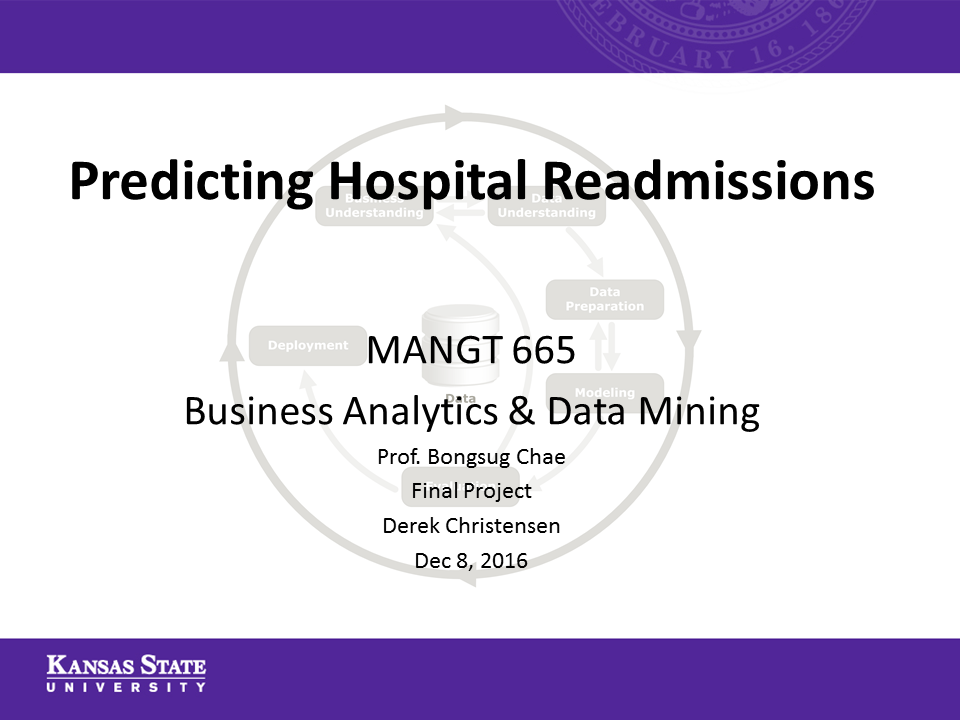

In [377]:
# input title slide here
Image('Images/christensen_finalprj/Slide1.png')

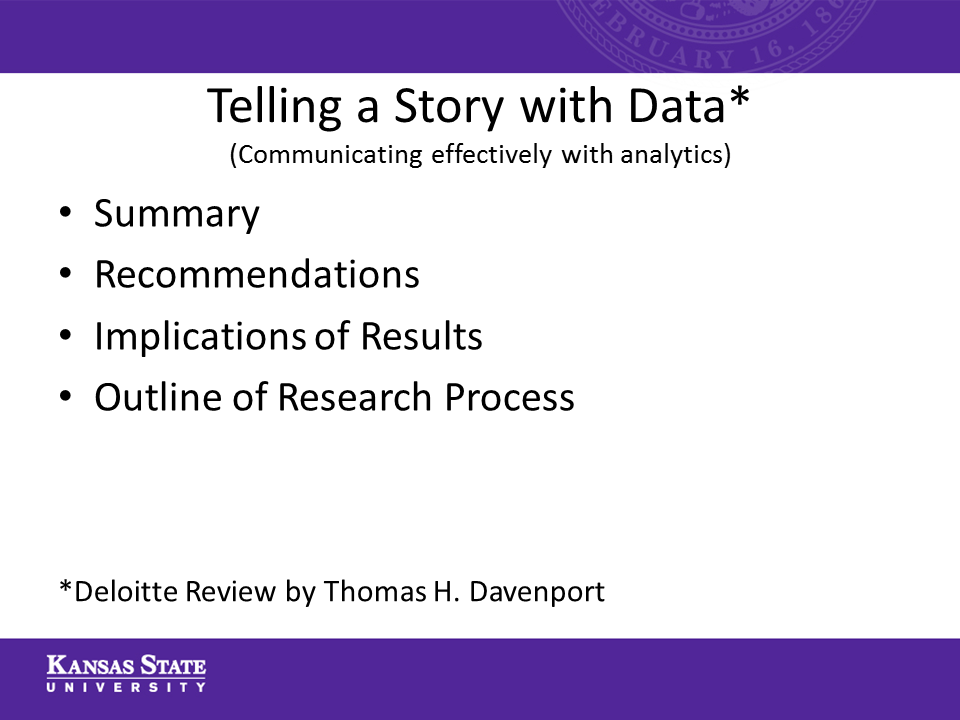

In [378]:
# input outline slide here
Image('Images/christensen_finalprj/Slide2.png')

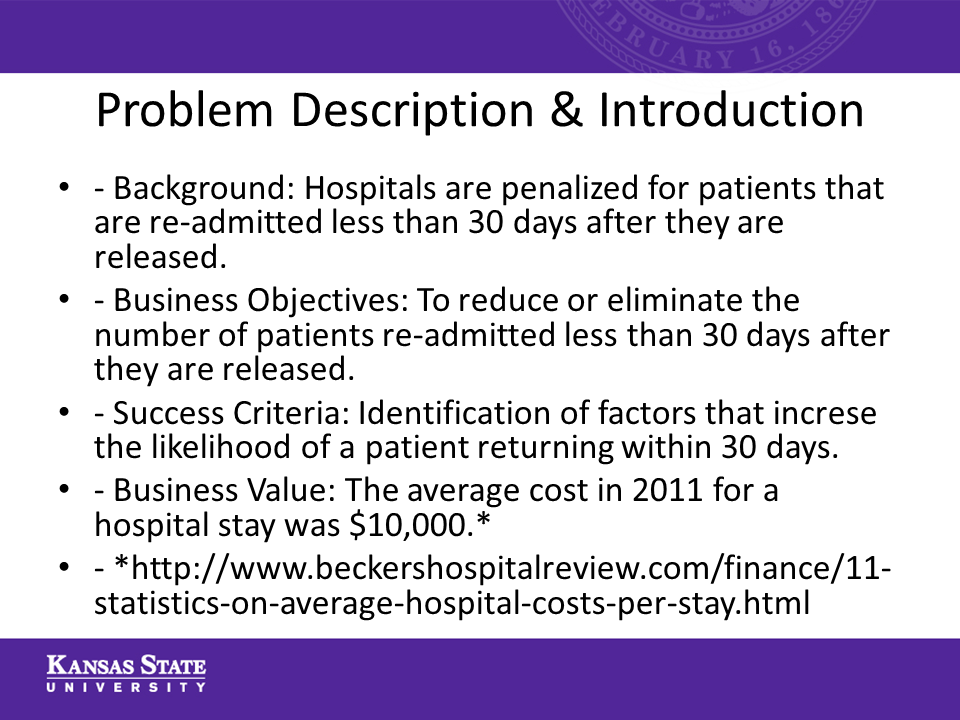

In [379]:
# input problem description & introduction slide here
Image('Images/christensen_finalprj/Slide3.png')

## 2. Business Understanding & Data Understanding
>### Determine Business Objectives: 
- Background: Hospitals are penalized for patients that are re-admitted less than 30 days after they are released.
- Business Objectives: To reduce or eliminate the number of patients re-admitted less than 30 days after they are released.
- Success Criteria: Identification of factors that increse the likelihood of a patient returning within 30 days.
- Business Value: The average cost in 2011 for a hospital stay was $10,000.*
- *http://www.beckershospitalreview.com/finance/11-statistics-on-average-hospital-costs-per-stay.html

In [380]:
# embed full problem description web image
Image(url= "https://72022e22-a-62cb3a1a-s-sites.googlegroups.com/site/christensenfinalprj/full-problem-description/christensen_finalprj-full-prob-descrp.png?attachauth=ANoY7coojyQ211rGpA2ygjc39hleeQ1Z-4R5R-B88BLBFtH1jAq2nT7l4JsRJfQhXwLYsBJ-HR_9ZFkGPGhybCqgeeBS4QVGujnYQae0dHKQCi6coswid7_6nzzAJ-riEv5DfvoEe1sls3dzBnvabtMJMesqIkRfqQSISQBI-Bdpp1ZveQ__SDPGMfWoW4kK1rmIropOOyy_2QQXBqRlq1hCp7cN6UPYzTlp54LBVweAnkfNexPQsIZDh90sH3xMlJGsDWOoDZHAHlB16u69fTPBSXvO57EqRNRejBKcU2bYYujzMRFjMp0%3D&attredirects=0")

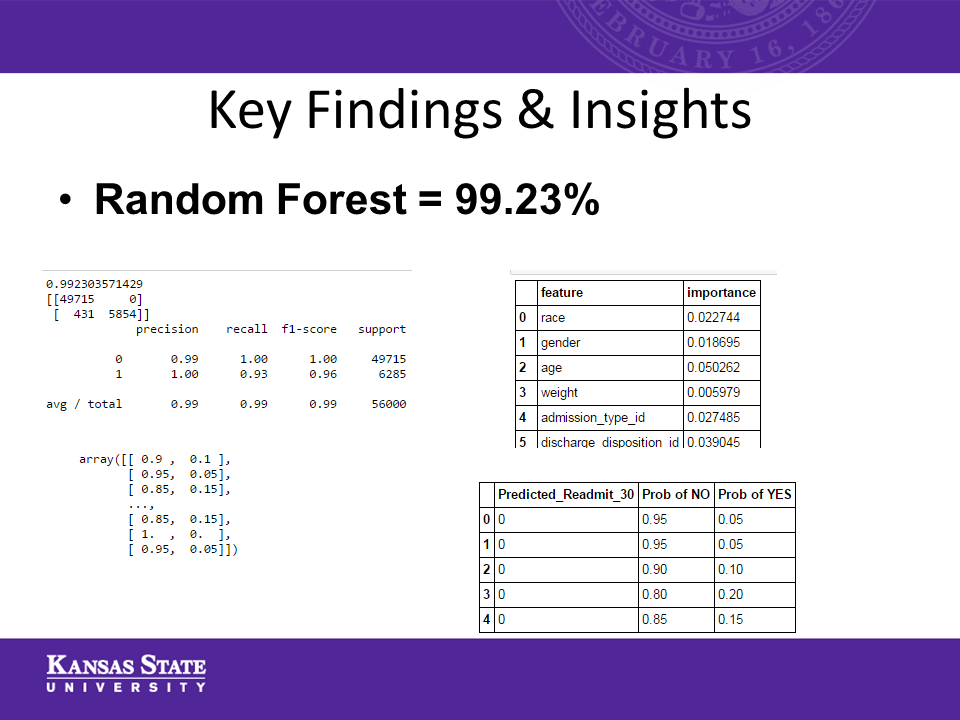

In [381]:
# input key findings & insights slide here
Image('Images/christensen_finalprj/Slide4.png')

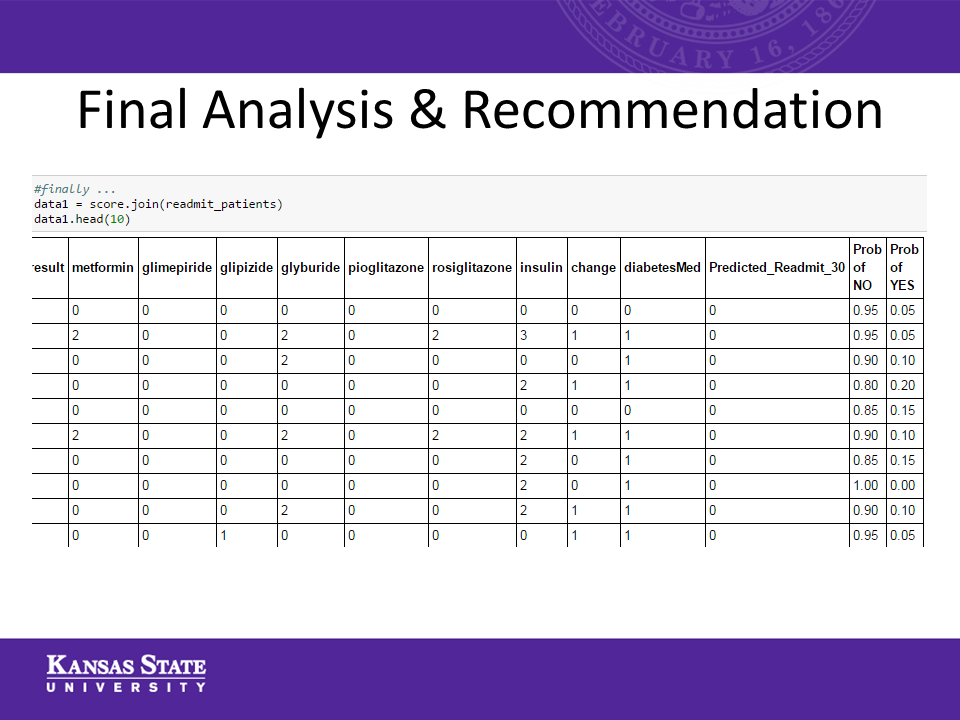

In [382]:
# input key final analysis & recommendation slide here
Image('Images/christensen_finalprj/Slide5.png')

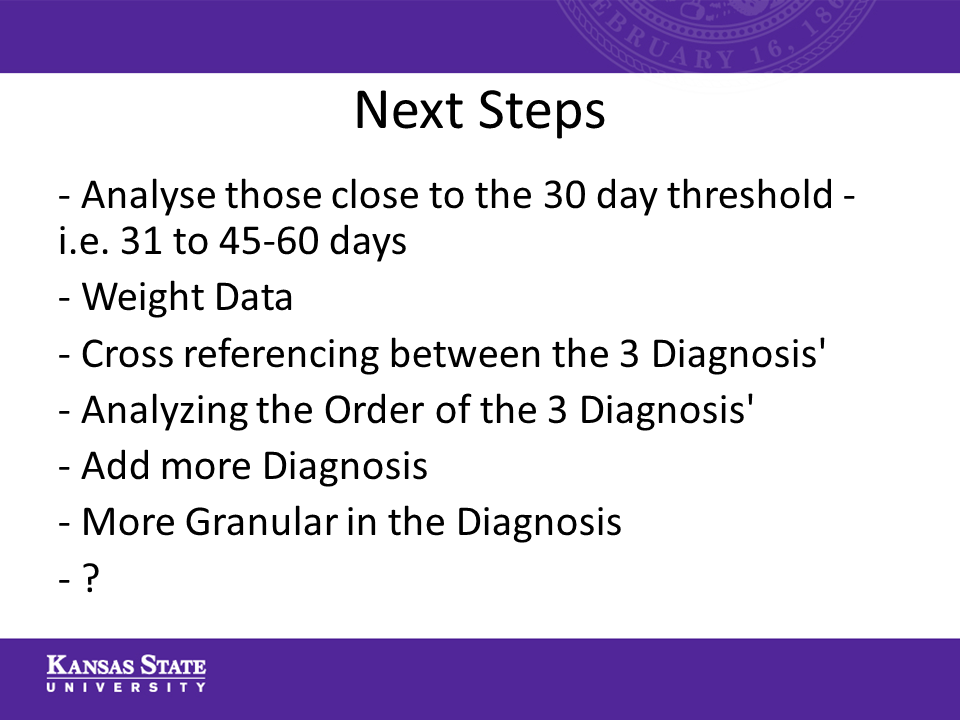

In [383]:
# input next steps slide here
Image('Images/christensen_finalprj/Slide6.png')

>## Next Steps Ideas
- Analyse those close to the 30 day threshold - i.e. 31 to 45-60 days
- Weight Data
- Cross referencing between the 3 Diagnosis'
- Analyzing the Order of the 3 Diagnosis'
- Add more Diagnosis
- More Granular in the Diagnosis
- ?

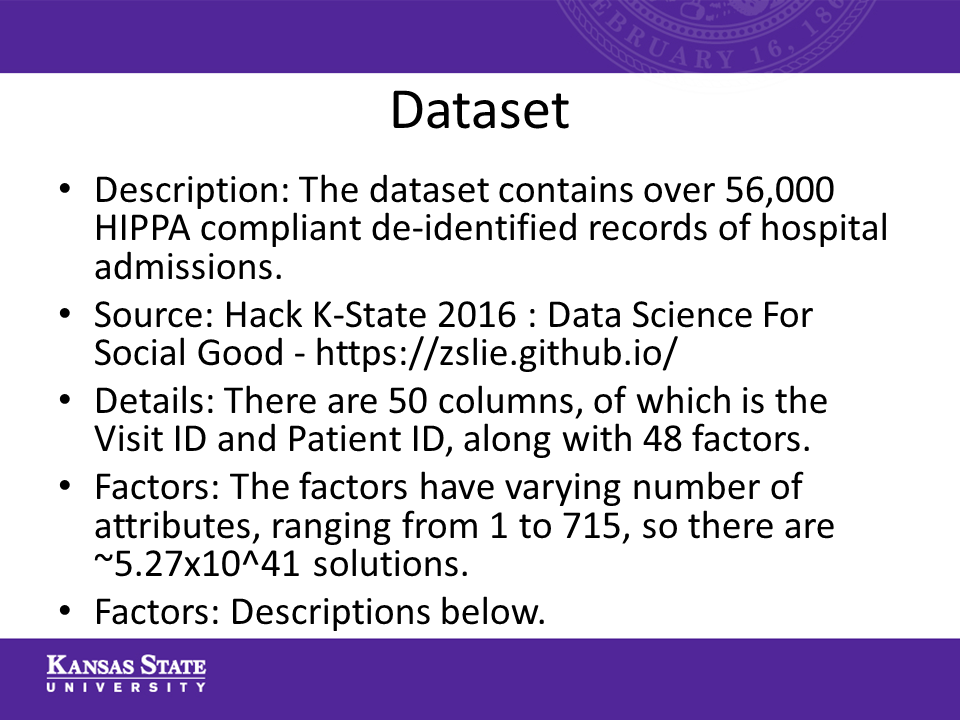

In [384]:
# input dataset slide here
Image('Images/christensen_finalprj/Slide7.png')

## 3. Data Identification & Collection
>### Determine Business Objectives: 
- Description: The dataset contains over 56,000 HIPPA compliant de-identified records of hospital admissions.
- Source: Hack K-State 2016 : Data Science For Social Good - https://zslie.github.io/
- Details: There are 50 columns, of which is the Visit ID and Patient ID, along with 48 factors.
- Factors: The factors have varying number of attributes, ranging from 1 to 715, so there are ~5.27x10^41 solutions.
- Factors: Descriptions below.

In [259]:
#embed factor descriptions 'fd'
fd = pd.read_excel('data/factor-definitions.xlsx')
fd

,Column Name,Column Value,Type,Description and values
0,encounter_id,Encounter ID,Numeric,Unique identifier of an encounter
1,patient_nbr,Patient number,Numeric,Unique identifier of a patient
2,race,Race,Nominal,"Values: Caucasian, Asian, African American, Hi..."
3,gender,Gender,Nominal,"Values: male, female, and unknown/invalid"
4,age,Age,Nominal,"Grouped in 10-year intervals: [0, 10), [10, 20..."
5,weight,Weight,Numeric,Weight in pounds.
6,admission_type_id,Admission Type,Nominal,Integer identifier corresponding to 9 distinct...
7,discharge_disposition_id,Discharge Disposition,Nominal,Integer identifier corresponding to 29 distinc...
8,admission_source_id,Admission Source,Nominal,Integer identifier corresponding to 21 distinc...
9,time_in_hospital,Time in Hospital,Numeric,Integer number of days between admission and d...


>## Performed some data manipulation directly in excel, including:
- Changed <string> 'medical_specialy' to <int> 'MED_SPEC_NUM'
- Changed the 3 <string/int> 'diag_x's to <int> 'DIAG_CAT_X'S & converted 858 unique diagnosis' into 33 Diagnosis Categories
- Notes are in Challenge_1_Training_Data_Conversion.xlsx file on the "Storage" page

In [260]:
#import patient data
df = pd.read_csv('data/Challenge_1_Training_Work_Clean.csv')
df.head(5)

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,DIAG_CAT_1,diag_2,DIAG_CAT_2,diag_3,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
0,22915332,1475073,Caucasian,Female,[80-90),?,3,1,4,5,?,?,0,39,3,11,0,0,0,414,10,289,4,593,18,7,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30
1,158361324,93771396,Caucasian,Female,[70-80),?,5,3,1,6,MC,?,0,79,1,25,3,0,0,518,16,428,13,496,16,9,None,None,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO
2,120453192,24581277,Other,Female,[60-70),?,1,22,7,4,SP,InternalMedicine,18,29,2,18,0,0,1,820,24,599,18,191,2,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,NO
3,25590894,5041395,Caucasian,Male,[70-80),?,1,1,7,3,?,InternalMedicine,18,72,3,18,0,0,0,537,17,280,4,250.41,3,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,>30
4,154290822,49027563,Caucasian,Female,[30-40),?,2,1,1,3,?,?,0,21,1,6,0,0,0,790,23,599,18,V42,32,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO


In [261]:
# Number of unique values in each column
df.apply(pd.Series.nunique)

encounter_id                56000
patient_nbr                 44369
race                            6
gender                          2
age                            10
weight                         10
admission_type_id               8
discharge_disposition_id       26
admission_source_id            17
time_in_hospital               14
payer_code                     17
medical_specialty              64
MED_SPEC_NUM                   64
num_lab_procedures            114
num_procedures                  7
num_medications                73
number_outpatient              32
number_emergency               25
number_inpatient               21
diag_1                        661
DIAG_CAT_1                     31
diag_2                        668
DIAG_CAT_2                     30
diag_3                        715
DIAG_CAT_3                     30
number_diagnoses               16
max_glu_serum                   4
A1Cresult                       4
metformin                       4
repaglinide   

In [262]:
#show the information about the data'
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56000 entries, 0 to 55999
Data columns (total 54 columns):
encounter_id                56000 non-null int64
patient_nbr                 56000 non-null int64
race                        56000 non-null object
gender                      56000 non-null object
age                         56000 non-null object
weight                      56000 non-null object
admission_type_id           56000 non-null int64
discharge_disposition_id    56000 non-null int64
admission_source_id         56000 non-null int64
time_in_hospital            56000 non-null int64
payer_code                  56000 non-null object
medical_specialty           56000 non-null object
MED_SPEC_NUM                56000 non-null int64
num_lab_procedures          56000 non-null int64
num_procedures              56000 non-null int64
num_medications             56000 non-null int64
number_outpatient           56000 non-null int64
number_emergency            56000 non-null int64
num

In [263]:
#describe the column readmitted only (e.g., count, unique, frequency)
df['readmitted'].describe()

count     56000
unique        3
top          NO
freq      30238
Name: readmitted, dtype: object

In [264]:
#distribution of 0 and 1 in the readmitted column
df.groupby('readmitted').count()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,DIAG_CAT_1,diag_2,DIAG_CAT_2,diag_3,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed
readmitted,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
<30,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285
>30,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477
NO,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238


In [265]:
#replace the values of the 'readmitted' column:
# NO = 0
# >30 = 1
# <30 = 2

df = df.replace({'readmitted': {'NO': 0, '>30': 1, '<30': 2}})

df.head(2)

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,DIAG_CAT_1,diag_2,DIAG_CAT_2,diag_3,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
0,22915332,1475073,Caucasian,Female,[80-90),?,3,1,4,5,?,?,0,39,3,11,0,0,0,414,10,289,4,593,18,7,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,1
1,158361324,93771396,Caucasian,Female,[70-80),?,5,3,1,6,MC,?,0,79,1,25,3,0,0,518,16,428,13,496,16,9,None,None,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,0


>## Key Business Data Question Summary
- Of 56,000 hospital visits in this dB:
   - 6,285 were re-admitted < 30 days - these are the instances that need solved for
   - 19,477 were also re-admitted, but after the 30 day threshold
   - 30,238 were not re-admitted - there could be some insight also gleaned from why they DID'T have to be re-admitted

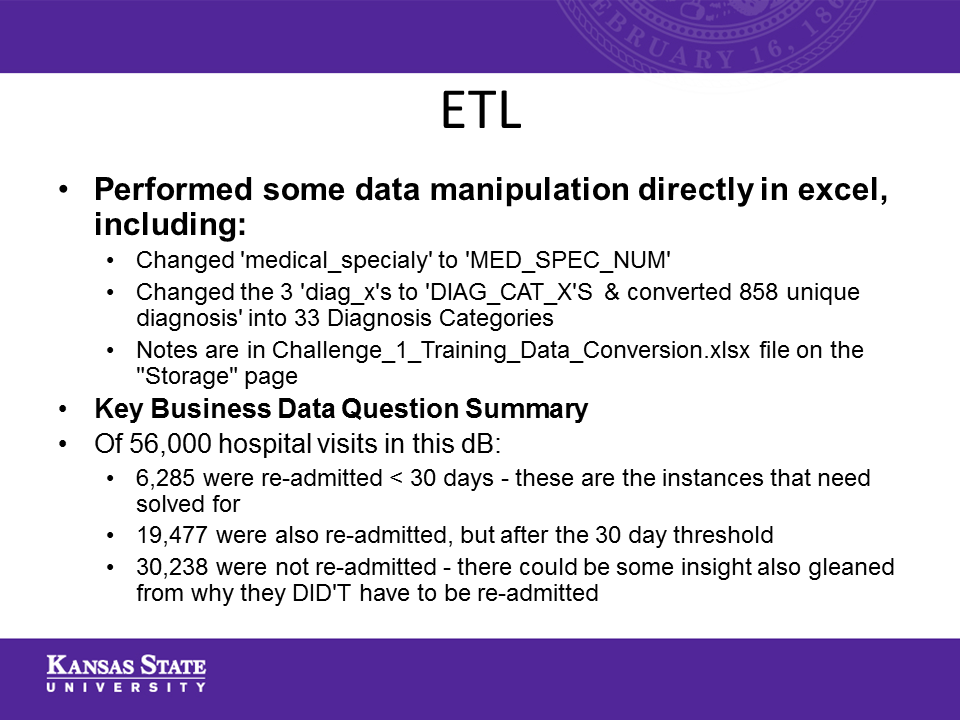

In [385]:
# input ETL slide here
Image('Images/christensen_finalprj/Slide8.png')

>## Data understanding & processing (ETL)

In [267]:
#drop or remove the columns 'encounter_id', 'patient_nbr' since this column is not used in the analysis and disply the result
df = df.drop('encounter_id', axis=1)
df = df.drop('patient_nbr', axis=1)
df = df.drop('medical_specialty', axis=1)

# drop or remove the columns 'diag_1', 'diag_2' and 'diag_3' since these values of been put into catergories
# in columns 'DIAG_CAT_1', 'DIAG_CAT_2' and 'DIAG_CAT_3'
df = df.drop('diag_1', axis=1)
df = df.drop('diag_2', axis=1)
df = df.drop('diag_3', axis=1)

df.head(5)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
0,Caucasian,Female,[80-90),?,3,1,4,5,?,0,39,3,11,0,0,0,10,4,18,7,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,1
1,Caucasian,Female,[70-80),?,5,3,1,6,MC,0,79,1,25,3,0,0,16,13,16,9,None,None,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,0
2,Other,Female,[60-70),?,1,22,7,4,SP,18,29,2,18,0,0,1,24,18,2,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,0
3,Caucasian,Male,[70-80),?,1,1,7,3,?,18,72,3,18,0,0,0,17,4,3,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,1
4,Caucasian,Female,[30-40),?,2,1,1,3,?,0,21,1,6,0,0,0,23,18,32,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,0


In [268]:
#distribution of races in the race column
df.groupby('race').count()

,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
race,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
?,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215,1215
AfricanAmerican,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563,10563
Asian,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356,356
Caucasian,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886,41886
Hispanic,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117,1117
Other,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863,863


In [269]:
#replace the values of the 'race' column:
# ? = 0
# AfricanAmerican = 1
# Asian = 2
# Caucasion = 3
# Hispanic = 4
# Other = 5

df = df.replace({'race': {'?': 0, 'AfricanAmerican': 1, 'Asian': 2,'Caucasian': 3,'Hispanic': 4,'Other': 5}})

df.head(2)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
0,3,Female,[80-90),?,3,1,4,5,?,0,39,3,11,0,0,0,10,4,18,7,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,1
1,3,Female,[70-80),?,5,3,1,6,MC,0,79,1,25,3,0,0,16,13,16,9,None,None,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,0


In [270]:
#distribution of genders in the gender column
df.groupby('gender').count()

,race,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
gender,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Female,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990,29990
Male,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010,26010


In [271]:
#replace the values of the 'gender' column:
# Female = 0
# Male = 1

df = df.replace({'gender': {'Male': 1, 'Female': 0}})

df.head(2)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
0,3,0,[80-90),?,3,1,4,5,?,0,39,3,11,0,0,0,10,4,18,7,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,1
1,3,0,[70-80),?,5,3,1,6,MC,0,79,1,25,3,0,0,16,13,16,9,None,None,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,0


In [272]:
#distribution of decade age categories in the age column
df.groupby('age').count()

,race,gender,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
age,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
[0-10),98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98
[10-20),355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355,355
[20-30),934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934,934
[30-40),2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070
[40-50),5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237,5237
[50-60),9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578,9578
[60-70),12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422,12422
[70-80),14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356,14356
[80-90),9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436,9436


In [273]:
#replace the values of the 'age' column:
# [0-10) = 0
# [10-20) = 1
# [20-30) = 2
# [30-40) = 3
# [40-50) = 4
# [50-60) = 5
# [60-70) = 6
# [70-80) = 7
# [80-90) = 8
# [90-100) = 9

df = df.replace({'age': {'[0-10)': 0, '[10-20)': 1, '[20-30)': 2, '[30-40)': 3, '[40-50)': 4, '[50-60)': 5, '[60-70)': 6, '[70-80)': 7, '[80-90)': 8, '[90-100)': 9}})

df.head(2)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
0,3,0,8,?,3,1,4,5,?,0,39,3,11,0,0,0,10,4,18,7,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,1
1,3,0,7,?,5,3,1,6,MC,0,79,1,25,3,0,0,16,13,16,9,None,None,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,0


In [274]:
#distribution of weight categories in the weight column
df.groupby('weight').count()

,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
weight,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
>200,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
?,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238,54238
[0-25),27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27
[100-125),349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349,349
[125-150),67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67,67
[150-175),19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19
[175-200),7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7
[25-50),58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58
[50-75),488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488,488


In [275]:
#replace the values of the 'weight' column:
# ? = 0
# [0-25) = 1
# [25-50) = 2
# [50-75) = 3
# [75-100) = 4
# [100-125) = 5
# [125-150) = 6
# [150-175) = 7
# [175-200) = 8
# > 200 = 9

df = df.replace({'weight': {'?': 0, '[0-25)': 1, '[25-50)': 2, '[50-75)': 3, '[75-100)': 4, '[100-125)': 5, '[125-150)': 6, '[150-175)': 7, '[175-200)': 8, '>200': 9}})

df.head(2)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
0,3,0,8,0,3,1,4,5,?,0,39,3,11,0,0,0,10,4,18,7,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,1
1,3,0,7,0,5,3,1,6,MC,0,79,1,25,3,0,0,16,13,16,9,None,None,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,0


In [276]:
#distribution of pay types in the payer_code column
df.groupby('payer_code').count()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
payer_code,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
?,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153,22153
BC,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550,2550
CH,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81
CM,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044,1044
CP,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405,1405
DM,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309,309
HM,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506,3506
MC,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855,17855
MD,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977,1977


In [277]:
#replace the values of the 'payer_code' column:

df = df.replace({'payer_code': {'?': 0, 'BC': 1, 'CH': 2, 'CM': 3, 'CP': 4, 'DM': 5, 'HM': 6, 'MC': 7, 'MD': 8, 'MP': 9, 'OG': 10, 'OT': 11, 'PO': 12, 'SI': 13, 'SP': 14, 'UN': 15, 'WC': 16}})

df.head(2)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
0,3,0,8,0,3,1,4,5,0,0,39,3,11,0,0,0,10,4,18,7,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,1
1,3,0,7,0,5,3,1,6,7,0,79,1,25,3,0,0,16,13,16,9,None,None,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,0


In [278]:
#distribution of categories in the max_glu_serum column
df.groupby('max_glu_serum').count()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
max_glu_serum,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
>200,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800,800
>300,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692,692
None,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027,53027
Norm,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481,1481


In [279]:
#replace the values of the 'max_glu_serum' column:
# None = 0
# Norm = 1
# >200 = 2
# >300 = 3

df = df.replace({'max_glu_serum': {'None': 0, 'Norm': 1, '>200': 2, '>300': 3}})

df.head(2)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
0,3,0,8,0,3,1,4,5,0,0,39,3,11,0,0,0,10,4,18,7,0,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,1
1,3,0,7,0,5,3,1,6,7,0,79,1,25,3,0,0,16,13,16,9,0,None,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,0


In [280]:
#distribution of categories in the A1Cresult column
df.groupby('A1Cresult').count()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
A1Cresult,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
>7,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143,2143
>8,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523,4523
None,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560,46560
Norm,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774,2774


In [281]:
#replace the values of the 'A1Cresult' column:
# None = 0
# Norm = 1
# >7 = 2
# >8 = 3

df = df.replace({'A1Cresult': {'None': 0, 'Norm': 1, '>7': 2, '>8': 3}})

df.head(2)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
0,3,0,8,0,3,1,4,5,0,0,39,3,11,0,0,0,10,4,18,7,0,0,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,1
1,3,0,7,0,5,3,1,6,7,0,79,1,25,3,0,0,16,13,16,9,0,0,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,0


In [282]:
#distribution of Ch or No in the change column
df.groupby('change').count()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,diabetesMed,readmitted
change,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Ch,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910,25910
No,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090,30090


In [283]:
#replace the values of the 'change' column:
# No = 0
# Ch = 1

df = df.replace({'change': {'No': 0, 'Ch': 1}})

df.head(2)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
0,3,0,8,0,3,1,4,5,0,0,39,3,11,0,0,0,10,4,18,7,0,0,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,0,Yes,1
1,3,0,7,0,5,3,1,6,7,0,79,1,25,3,0,0,16,13,16,9,0,0,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,1,Yes,0


In [284]:
#distribution of No or Yes in the diabetesMed column
df.groupby('diabetesMed').count()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,readmitted
diabetesMed,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
No,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890,12890
Yes,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110,43110


In [285]:
#replace the values of the 'diabetesMed' column:
# No = 0
# Yes = 1

df = df.replace({'diabetesMed': {'No': 0, 'Yes': 1,}})

df.head(2)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
0,3,0,8,0,3,1,4,5,0,0,39,3,11,0,0,0,10,4,18,7,0,0,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,0,1,1
1,3,0,7,0,5,3,1,6,7,0,79,1,25,3,0,0,16,13,16,9,0,0,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,1,1,0


In [286]:
#distribution of the medical specialty categories in the MED_SPEC_NUM column
df.groupby('MED_SPEC_NUM').count()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
MED_SPEC_NUM,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562,27562
1,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
2,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7
3,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12
4,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912
5,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
6,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
7,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
8,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189


In [287]:
#distribution of diagnosis categories in the DIAG_CAT_1 column
df.groupby('DIAG_CAT_1').count()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
DIAG_CAT_1,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11
1,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72,72
2,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900,1900
3,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311,6311
4,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624
5,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233,1233
6,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632,1632
7,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
8,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89


In [288]:
#distribution of diagnosis categories in the DIAG_CAT_2 column
df.groupby('DIAG_CAT_2').count()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
DIAG_CAT_2,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180
1,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193
2,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392,1392
3,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530,11530
4,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649,1649
5,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436,1436
6,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964,964
8,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188,188
9,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946,3946


In [289]:
#distribution of diagnosis categories in the DIAG_CAT_3 column
df.groupby('DIAG_CAT_3').count()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
DIAG_CAT_3,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768,768
1,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196,196
2,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003,1003
3,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633,14633
4,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369,1369
5,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744,1744
6,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106,1106
8,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231
9,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087,6087


In [290]:
#replace the values in the medicene column:
# No = 0
# Down = 1
# Steady = 2
# Up = 3

df = df.replace({'metformin': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'repaglinide': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'nateglinide': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'chlorpropamide': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'glimepiride': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'acetohexamide': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'glipizide': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'glyburide': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'tolbutamide': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'pioglitazone': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'rosiglitazone': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'acarbose': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'miglitol': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'troglitazone': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'tolazamide': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'examide': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'citoglipton': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'insulin': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'glyburide.metformin': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'glipizide.metformin': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'glimepiride.pioglitazone': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'metformin.rosiglitazone': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
df = df.replace({'metformin.pioglitazone': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})

df.head(2)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
0,3,0,8,0,3,1,4,5,0,0,39,3,11,0,0,0,10,4,18,7,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
1,3,0,7,0,5,3,1,6,7,0,79,1,25,3,0,0,16,13,16,9,0,0,2,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,1,1,0


In [291]:
# check to make sure all factors are now int
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56000 entries, 0 to 55999
Data columns (total 48 columns):
race                        56000 non-null int64
gender                      56000 non-null int64
age                         56000 non-null int64
weight                      56000 non-null int64
admission_type_id           56000 non-null int64
discharge_disposition_id    56000 non-null int64
admission_source_id         56000 non-null int64
time_in_hospital            56000 non-null int64
payer_code                  56000 non-null int64
MED_SPEC_NUM                56000 non-null int64
num_lab_procedures          56000 non-null int64
num_procedures              56000 non-null int64
num_medications             56000 non-null int64
number_outpatient           56000 non-null int64
number_emergency            56000 non-null int64
number_inpatient            56000 non-null int64
DIAG_CAT_1                  56000 non-null int64
DIAG_CAT_2                  56000 non-null int64
DIAG_CAT_

In [292]:
# save converted data frame with only int to a new file
df_clean_NoString = df

In [293]:
# check to make sure all factors of the new data frame are int
df_clean_NoString.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56000 entries, 0 to 55999
Data columns (total 48 columns):
race                        56000 non-null int64
gender                      56000 non-null int64
age                         56000 non-null int64
weight                      56000 non-null int64
admission_type_id           56000 non-null int64
discharge_disposition_id    56000 non-null int64
admission_source_id         56000 non-null int64
time_in_hospital            56000 non-null int64
payer_code                  56000 non-null int64
MED_SPEC_NUM                56000 non-null int64
num_lab_procedures          56000 non-null int64
num_procedures              56000 non-null int64
num_medications             56000 non-null int64
number_outpatient           56000 non-null int64
number_emergency            56000 non-null int64
number_inpatient            56000 non-null int64
DIAG_CAT_1                  56000 non-null int64
DIAG_CAT_2                  56000 non-null int64
DIAG_CAT_

In [294]:
# write dataframe with no string values to new csv file
df_clean_NoString.to_csv('data/Challenge_1_Training_Work_Clean_NoString.csv')

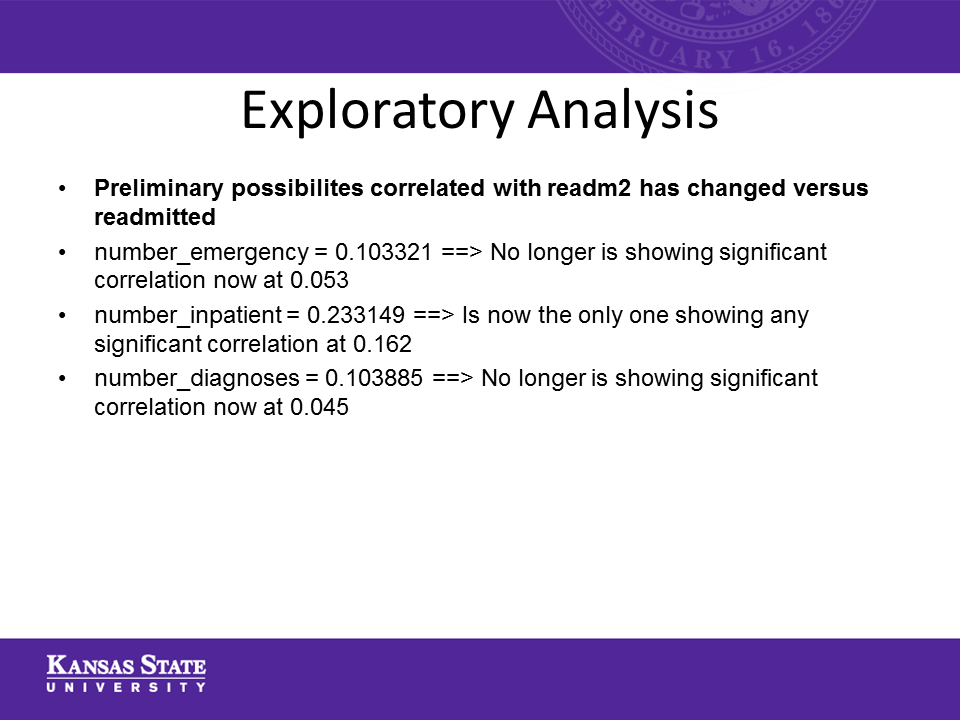

In [386]:
# input exploratory analysis slide here
Image('Images/christensen_finalprj/Slide9.png')

>## Exploratory data analysis

In [296]:
#import ETL patient data
df = pd.read_csv('data/Challenge_1_Training_Work_Clean_NoString.csv')
df.head(5)

,Unnamed: 0,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
0,0,3,0,8,0,3,1,4,5,0,0,39,3,11,0,0,0,10,4,18,7,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
1,1,3,0,7,0,5,3,1,6,7,0,79,1,25,3,0,0,16,13,16,9,0,0,2,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,1,1,0
2,2,5,0,6,0,1,22,7,4,14,18,29,2,18,0,0,1,24,18,2,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,1,0
3,3,3,1,7,0,1,1,7,3,0,18,72,3,18,0,0,0,17,4,3,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,1,1
4,4,3,0,3,0,2,1,1,3,0,0,21,1,6,0,0,0,23,18,32,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [297]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56000 entries, 0 to 55999
Data columns (total 49 columns):
Unnamed: 0                  56000 non-null int64
race                        56000 non-null int64
gender                      56000 non-null int64
age                         56000 non-null int64
weight                      56000 non-null int64
admission_type_id           56000 non-null int64
discharge_disposition_id    56000 non-null int64
admission_source_id         56000 non-null int64
time_in_hospital            56000 non-null int64
payer_code                  56000 non-null int64
MED_SPEC_NUM                56000 non-null int64
num_lab_procedures          56000 non-null int64
num_procedures              56000 non-null int64
num_medications             56000 non-null int64
number_outpatient           56000 non-null int64
number_emergency            56000 non-null int64
number_inpatient            56000 non-null int64
DIAG_CAT_1                  56000 non-null int64
DIAG_CAT_

In [298]:
#drop or remove the column 'Unnamed: 0' since this column is not used in the analysis and disply the result
df = df.drop('Unnamed: 0', axis=1)
df.head(2)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
0,3,0,8,0,3,1,4,5,0,0,39,3,11,0,0,0,10,4,18,7,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
1,3,0,7,0,5,3,1,6,7,0,79,1,25,3,0,0,16,13,16,9,0,0,2,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,1,1,0


In [299]:
# basic statistics
df.describe()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
count,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.0,56000.0,56000.000000,56000.000000,56000.000000,56000.0,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000
mean,2.602071,0.464464,6.096589,0.123946,2.016893,3.721821,5.756643,4.398161,4.369375,10.668643,43.141661,1.335893,16.009268,0.367321,0.196875,0.637054,14.213321,12.011054,11.357411,7.423750,0.092089,0.368375,0.398875,0.029911,0.014089,0.001732,0.102536,0.000036,0.254732,0.210071,0.000357,0.146161,0.125821,0.006214,0.000857,0.000107,0.000714,0.0,0.0,1.058839,0.013214,0.000321,0.0,0.000036,0.000036,0.462679,0.769821,0.572268
std,0.937754,0.498740,1.590761,0.712004,1.438340,5.291517,4.053838,2.984346,4.363828,15.595799,19.656507,1.702009,8.132455,1.249570,0.916820,1.270768,7.272908,7.443902,8.157131,1.931488,0.431655,0.890972,0.815169,0.247161,0.169132,0.060480,0.449274,0.008452,0.678992,0.627625,0.026724,0.525985,0.490002,0.112904,0.042249,0.014638,0.037790,0.0,0.0,1.102484,0.162472,0.025353,0.0,0.008452,0.008452,0.498610,0.420951,0.685018
min,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,0.000000,5.000000,0.000000,1.000000,1.000000,1.000000,2.000000,0.000000,0.000000,32.000000,0.000000,10.000000,0.000000,0.000000,0.000000,10.000000,4.000000,3.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.000000
50%,3.000000,0.000000,6.000000,0.000000,1.000000,1.000000,7.000000,4.000000,6.000000,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,15.000000,12.000000,10.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,1.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.000000
75%,3.000000,1.000000,7.000000,0.000000,3.000000,4.000000,7.000000,6.000000,7.000000,18.000000,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,18.000000,17.000000,17.000000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,2.000000,0.000000,0.000000,0.0,0.000000,0.000000,1.000000,1.000000,1.000000
max,5.000000,1.000000,9.000000,9.000000,8.000000,28.000000,25.000000,14.000000,16.000000,63.000000,132.000000,6.000000,75.000000,42.000000,76.000000,21.000000,32.000000,32.000000,32.0000

>## Basic Statistics Notes
- mean: caucasion, female, 60's, Urgent, Discharged/Txfr'd, Txfr from facility, 4.4 days, CP payer, 43 lab procedures, 16 meds,
- 0.4 out patient visit prev yr, 0.2 ER visits, 0.64 Inpatient, 7.4 diag's, 0.09 Gluc, Ai 0.4, 
- Several Meds at 0 to little use - need to eliminate some meds
- Need to use dummy variables for 'readmitted' and combine No/0 and >30/1, since the question is if admitted <30 only

In [300]:
# correlation analysis
df.corr()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
race,1.000000,0.061706,0.114255,0.040520,0.096587,0.005805,0.033113,-0.020364,0.041640,-0.030777,-0.023193,0.024391,0.022157,0.050845,-0.012812,-0.006053,0.042924,0.029594,0.016000,0.081672,0.054576,-0.013318,0.010548,0.025466,-0.004170,0.006801,0.008261,0.001793,0.018551,0.015784,-0.001455,0.026105,0.005938,0.013237,-0.001307,0.003106,0.003990,NaN,NaN,-0.039862,0.006384,0.005380,NaN,-0.011726,0.001793,0.008300,-0.004537,0.014912
gender,0.061706,1.000000,-0.048579,0.014491,0.014578,-0.019566,-0.005222,-0.031088,0.000833,0.016623,-0.004968,0.061668,-0.023819,-0.005846,-0.024202,-0.013405,-0.034311,0.008083,0.008343,-0.007818,-0.001347,0.016539,0.001549,-0.004777,-0.005390,0.006481,-0.000156,-0.003935,0.026810,0.034631,-0.001727,0.002339,0.010843,0.010581,0.009920,0.007860,0.003242,NaN,NaN,0.000247,0.002489,0.007965,NaN,0.004538,-0.003935,0.012476,0.015391,-0.013626
age,0.114255,-0.048579,1.000000,0.005716,-0.005747,0.113970,0.041070,0.107273,0.058032,-0.068202,0.025665,-0.028360,0.039010,0.029064,-0.089149,-0.047012,0.091837,0.077541,0.052021,0.243515,0.018618,-0.147559,-0.060696,0.045565,0.020363,0.012367,0.044360,0.002400,0.055867,0.076798,0.010110,0.013860,0.003034,0.008092,0.011788,-0.001978,0.003605,NaN,NaN,-0.079078,-0.002451,0.003658,NaN,0.002400,-0.000257,-0.037793,-0.025360,0.029704
weight,0.040520,0.014491,0.005716,1.000000,0.037503,-0.035383,0.003026,0.023652,0.047819,0.004630,0.090456,0.018693,0.011274,0.104440,0.003706,-0.009154,0.023982,0.031824,0.014000,0.054391,-0.037139,-0.021109,0.007304,-0.005440,0.010707,-0.000839,0.013694,-0.000736,0.017062,0.008707,-0.002326,0.026059,0.004232,0.010411,-0.003532,-0.001274,0.000692,NaN,NaN,-0.076697,-0.014159,-0.002207,NaN,-0.000736,-0.000736,-0.041219,-0.030585,0.027236
admission_type_id,0.096587,0.014578,-0.005747,0.037503,1.000000,0.085986,0.098007,-0.014285,-0.136863,0.185351,-0.145869,0.131923,0.075711,0.030746,-0.018190,-0.032648,0.032151,-0.005648,-0.008918,-0.113991,0.352793,-0.043929,0.008631,-0.003481,-0.008099,0.007875,-0.003178,-0.002988,0.007991,-0.002804,0.006347,0.018570,0.022930,0.006061,-0.001414,0.003307,0.010291,NaN,NaN,-0.025368,-0.000573,-0.005046,NaN,-0.002988,0.002888,0.003992,-0.003930,-0.008561
discharge_disposition_id,0.005805,-0.019566,0.113970,-0.035383,0.085986,1.000000,0.016614,0.161954,-0.123220,-0.024028,0.022906,0.015536,0.105415,-0.006101,-0.024692,0.019240,0.034616,0.029774,0.024778,0.049496,0.037086,-0.020713,-0.008376,-0.002759,-0.008790,0.018525,-0.022360,0.014597,-0.013379,0.048256,0.003228,-0.014116,-0.001694,0.006779,0.005779,0.008684,0.013139,NaN,NaN,-0.041842,-0.002994,0.000933,NaN,-0.002174,-0.000576,-0.014047,-0.029452,0.009300
admission_source_id,0.033113,-0.005222,0.041070,0.003026,0.098007,0.016614,1.000000,-0.006996,-0.100157,-0.152760,0.046823,-0.137044,-0.055016,0.028833,0.061938,0.033697,-0.007753,-0.019796,0.001447,0.076318,0.412356,0.006512,-0.033283,-0.003732,-0.019612,0.002666,-0.026685,0.001296,0.009300,0.004919,0.001791,-0.005729,-0.008894,-0.000753,-0.000763,0.002245,0.001834,NaN,NaN,0.005094,-0.024616,-0.000281,NaN,0.001296,-0.004958,0.002583,0.000535,0.030377
time_in_hospital,-0.020364,-0.031088,0.107273,0.023652,-0.014285,0.161954,-0.006996,1.000000,-0.037805,0.023146,0.318234,0.193139,0.468752,-0.003410,-0.005467,0.079929,-0.019913,0.086503,0.068677,0.224265,0.029079,0.058088

>## Correlation Analysis Notes:

- Lots of noise - need to narrow

Strongest +'s:
- #ER = 0.103
- #Inpatient = 0.233
- #Diag's = 0.104

Strongest -'s:
- MED_SPEC_NUM: -0.045  --> Which is irrelevant at this point as they are alphabetically sorted
- #Procedure's: -0.038
- metformin: -0.036


- No Correlation w/ several Med's


In [301]:
#drop or remove these columns since they are not used in any of the cases
df = df.drop('examide', axis=1)
df = df.drop('citoglipton', axis=1)
df = df.drop('glimepiride.pioglitazone', axis=1)

df.head(5)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide.metformin,glipizide.metformin,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
0,3,0,8,0,3,1,4,5,0,0,39,3,11,0,0,0,10,4,18,7,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
1,3,0,7,0,5,3,1,6,7,0,79,1,25,3,0,0,16,13,16,9,0,0,2,0,0,0,0,0,0,2,0,0,0,0,0,0,0,3,0,0,0,0,1,1,0
2,5,0,6,0,1,22,7,4,14,18,29,2,18,0,0,1,24,18,2,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0
3,3,1,7,0,1,1,7,3,0,18,72,3,18,0,0,0,17,4,3,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,1
4,3,0,3,0,2,1,1,3,0,0,21,1,6,0,0,0,23,18,32,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [302]:
#basic statistics
df.describe()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide.metformin,glipizide.metformin,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
count,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000
mean,2.602071,0.464464,6.096589,0.123946,2.016893,3.721821,5.756643,4.398161,4.369375,10.668643,43.141661,1.335893,16.009268,0.367321,0.196875,0.637054,14.213321,12.011054,11.357411,7.423750,0.092089,0.368375,0.398875,0.029911,0.014089,0.001732,0.102536,0.000036,0.254732,0.210071,0.000357,0.146161,0.125821,0.006214,0.000857,0.000107,0.000714,1.058839,0.013214,0.000321,0.000036,0.000036,0.462679,0.769821,0.572268
std,0.937754,0.498740,1.590761,0.712004,1.438340,5.291517,4.053838,2.984346,4.363828,15.595799,19.656507,1.702009,8.132455,1.249570,0.916820,1.270768,7.272908,7.443902,8.157131,1.931488,0.431655,0.890972,0.815169,0.247161,0.169132,0.060480,0.449274,0.008452,0.678992,0.627625,0.026724,0.525985,0.490002,0.112904,0.042249,0.014638,0.037790,1.102484,0.162472,0.025353,0.008452,0.008452,0.498610,0.420951,0.685018
min,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,0.000000,5.000000,0.000000,1.000000,1.000000,1.000000,2.000000,0.000000,0.000000,32.000000,0.000000,10.000000,0.000000,0.000000,0.000000,10.000000,4.000000,3.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,3.000000,0.000000,6.000000,0.000000,1.000000,1.000000,7.000000,4.000000,6.000000,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,15.000000,12.000000,10.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,3.000000,1.000000,7.000000,0.000000,3.000000,4.000000,7.000000,6.000000,7.000000,18.000000,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,18.000000,17.000000,17.000000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
max,5.000000,1.000000,9.000000,9.000000,8.000000,28.000000,25.000000,14.000000,16.000000,63.000000,132.000000,6.000000,75.000000,42.000000,76.000000,21.000000,32.000000,32.000000,32.000000,16.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,2.000000,3.000000,3.000000,2.000000,3.000000,3.000000,3.000000,3.

In [303]:
# correlation analysis
df.corr()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide.metformin,glipizide.metformin,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted
race,1.000000,0.061706,0.114255,0.040520,0.096587,0.005805,0.033113,-0.020364,0.041640,-0.030777,-0.023193,0.024391,0.022157,0.050845,-0.012812,-0.006053,0.042924,0.029594,0.016000,0.081672,0.054576,-0.013318,0.010548,0.025466,-0.004170,0.006801,0.008261,0.001793,0.018551,0.015784,-0.001455,0.026105,0.005938,0.013237,-0.001307,0.003106,0.003990,-0.039862,0.006384,0.005380,-0.011726,0.001793,0.008300,-0.004537,0.014912
gender,0.061706,1.000000,-0.048579,0.014491,0.014578,-0.019566,-0.005222,-0.031088,0.000833,0.016623,-0.004968,0.061668,-0.023819,-0.005846,-0.024202,-0.013405,-0.034311,0.008083,0.008343,-0.007818,-0.001347,0.016539,0.001549,-0.004777,-0.005390,0.006481,-0.000156,-0.003935,0.026810,0.034631,-0.001727,0.002339,0.010843,0.010581,0.009920,0.007860,0.003242,0.000247,0.002489,0.007965,0.004538,-0.003935,0.012476,0.015391,-0.013626
age,0.114255,-0.048579,1.000000,0.005716,-0.005747,0.113970,0.041070,0.107273,0.058032,-0.068202,0.025665,-0.028360,0.039010,0.029064,-0.089149,-0.047012,0.091837,0.077541,0.052021,0.243515,0.018618,-0.147559,-0.060696,0.045565,0.020363,0.012367,0.044360,0.002400,0.055867,0.076798,0.010110,0.013860,0.003034,0.008092,0.011788,-0.001978,0.003605,-0.079078,-0.002451,0.003658,0.002400,-0.000257,-0.037793,-0.025360,0.029704
weight,0.040520,0.014491,0.005716,1.000000,0.037503,-0.035383,0.003026,0.023652,0.047819,0.004630,0.090456,0.018693,0.011274,0.104440,0.003706,-0.009154,0.023982,0.031824,0.014000,0.054391,-0.037139,-0.021109,0.007304,-0.005440,0.010707,-0.000839,0.013694,-0.000736,0.017062,0.008707,-0.002326,0.026059,0.004232,0.010411,-0.003532,-0.001274,0.000692,-0.076697,-0.014159,-0.002207,-0.000736,-0.000736,-0.041219,-0.030585,0.027236
admission_type_id,0.096587,0.014578,-0.005747,0.037503,1.000000,0.085986,0.098007,-0.014285,-0.136863,0.185351,-0.145869,0.131923,0.075711,0.030746,-0.018190,-0.032648,0.032151,-0.005648,-0.008918,-0.113991,0.352793,-0.043929,0.008631,-0.003481,-0.008099,0.007875,-0.003178,-0.002988,0.007991,-0.002804,0.006347,0.018570,0.022930,0.006061,-0.001414,0.003307,0.010291,-0.025368,-0.000573,-0.005046,-0.002988,0.002888,0.003992,-0.003930,-0.008561
discharge_disposition_id,0.005805,-0.019566,0.113970,-0.035383,0.085986,1.000000,0.016614,0.161954,-0.123220,-0.024028,0.022906,0.015536,0.105415,-0.006101,-0.024692,0.019240,0.034616,0.029774,0.024778,0.049496,0.037086,-0.020713,-0.008376,-0.002759,-0.008790,0.018525,-0.022360,0.014597,-0.013379,0.048256,0.003228,-0.014116,-0.001694,0.006779,0.005779,0.008684,0.013139,-0.041842,-0.002994,0.000933,-0.002174,-0.000576,-0.014047,-0.029452,0.009300
admission_source_id,0.033113,-0.005222,0.041070,0.003026,0.098007,0.016614,1.000000,-0.006996,-0.100157,-0.152760,0.046823,-0.137044,-0.055016,0.028833,0.061938,0.033697,-0.007753,-0.019796,0.001447,0.076318,0.412356,0.006512,-0.033283,-0.003732,-0.019612,0.002666,-0.026685,0.001296,0.009300,0.004919,0.001791,-0.005729,-0.008894,-0.000753,-0.000763,0.002245,0.001834,0.005094,-0.024616,-0.000281,0.001296,-0.004958,0.002583,0.000535,0.030377
time_in_hospital,-0.020364,-0.031088,0.107273,0.023652,-0.014285,0.161954,-0.006996,1.000000,-0.037805,0.023146,0.318234,0.193139,0.468752,-0.003410,-0.005467,0.079929,-0.019913,0.086503,0.068677,0.224265,0.029079,0.058088,-0.009071,0.034985,0.003320,0.004094,0.016086,0.013596,0.016737,0.023482,0.001799,0.008521,0.008531,0.007231,0.005083,0.004746,0

> ## Preliminary possibilites correlated with readmitted
- number_emergency = 0.103321
- number_inpatient = 0.233149
- number_diagnoses = 0.103885



>No change from previous correlation analysis
Strongest +'s:
- #ER = 0.103
- #Inpatient = 0.233
- #Diag's = 0.104
Strongest -'s:
- MED_SPEC_NUM: -0.045  --> Which is irrelevant at this point as they are alphabetically sorted
- #Porcedure's: -0.038
- metformin: -0.036

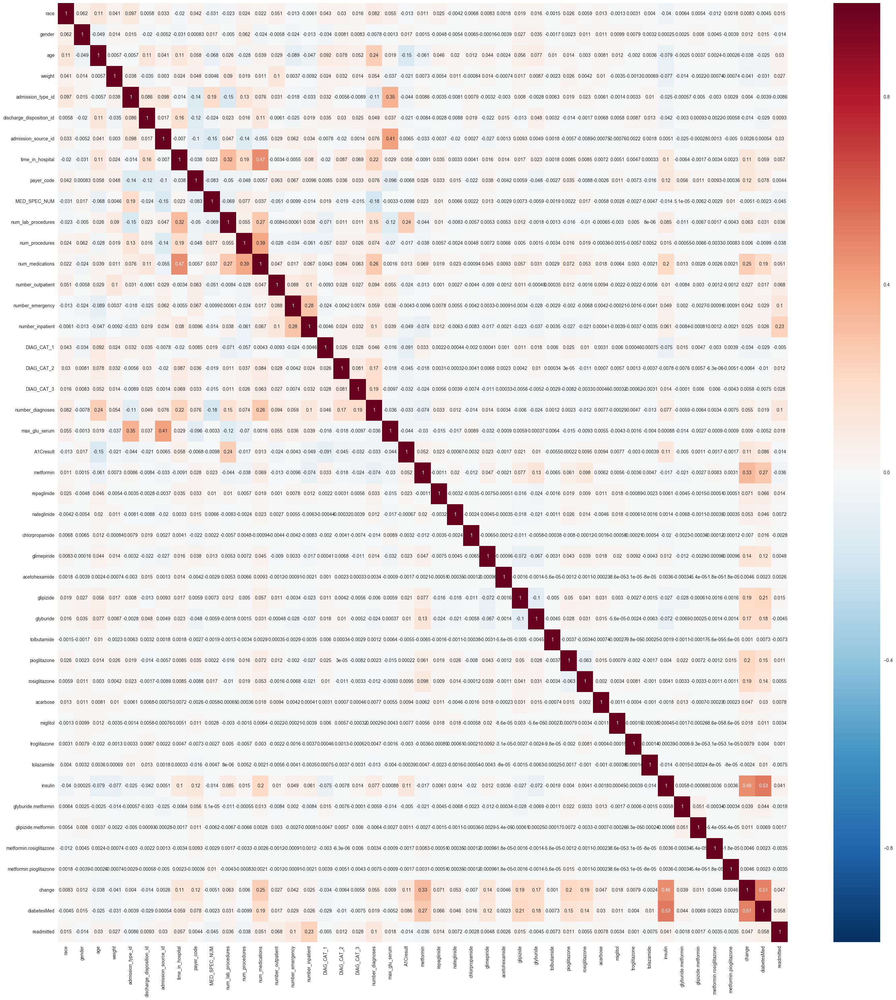

In [304]:
# heatmap for correlation
plt.figure(figsize=(35,36))
sns.heatmap(df.corr(), annot=True)

In [305]:
# describe for a single column
df['readmitted'].describe()

count    56000.000000
mean         0.572268
std          0.685018
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          2.000000
Name: readmitted, dtype: float64

In [306]:
# how many unique values in the 'readmitted' column
df.groupby('readmitted').size()

readmitted
0    30238
1    19477
2     6285
dtype: int64

In [307]:
# how many missing values in each column or variable
df.isnull().sum()

race                        0
gender                      0
age                         0
weight                      0
admission_type_id           0
discharge_disposition_id    0
admission_source_id         0
time_in_hospital            0
payer_code                  0
MED_SPEC_NUM                0
num_lab_procedures          0
num_procedures              0
num_medications             0
number_outpatient           0
number_emergency            0
number_inpatient            0
DIAG_CAT_1                  0
DIAG_CAT_2                  0
DIAG_CAT_3                  0
number_diagnoses            0
max_glu_serum               0
A1Cresult                   0
metformin                   0
repaglinide                 0
nateglinide                 0
chlorpropamide              0
glimepiride                 0
acetohexamide               0
glipizide                   0
glyburide                   0
tolbutamide                 0
pioglitazone                0
rosiglitazone               0
acarbose  

In [308]:
# pivot table for 'readmitted'
df.groupby(['readmitted']).count()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide.metformin,glipizide.metformin,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed
readmitted,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238,30238
1,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477,19477
2,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285


In [309]:
# pivot table for 'readmitted' showing mean value, not count
df.groupby(['readmitted']).mean()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide.metformin,glipizide.metformin,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed
readmitted,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2.589060,0.472088,6.050665,0.098717,2.025994,3.818606,5.613665,4.254415,4.325617,11.423771,42.454957,1.404061,15.639725,0.272042,0.105496,0.382036,14.233018,11.918612,11.127522,7.220914,0.085191,0.376315,0.422912,0.026324,0.012666,0.001654,0.099345,0.000000,0.243336,0.211820,0.000529,0.137245,0.119783,0.004928,0.000628,0.000066,0.000926,1.017792,0.013030,0.000265,0.000066,0.000066,0.438587,0.744857
1,2.614930,0.454177,6.146121,0.164091,2.012887,3.324383,5.958053,4.508703,4.467834,9.700056,43.880269,1.250655,16.344458,0.495456,0.294039,0.845356,14.223700,12.124352,11.623351,7.658366,0.098475,0.367613,0.381732,0.034091,0.016122,0.002310,0.108230,0.000103,0.270370,0.210197,0.000205,0.162448,0.139241,0.008472,0.001284,0.000205,0.000616,1.097808,0.014376,0.000411,0.000000,0.000000,0.491605,0.799096
2,2.624821,0.459666,6.164041,0.120923,1.985521,4.487828,5.820366,4.747176,4.274781,10.037232,44.156563,1.272076,16.748449,0.428640,0.335402,1.218457,14.086396,12.104694,11.639300,7.672554,0.105489,0.332538,0.336356,0.034208,0.014638,0.000318,0.100239,0.000000,0.261098,0.201273,0.000000,0.138584,0.113286,0.005410,0.000636,0.000000,0.000000,1.135561,0.010501,0.000318,0.000000,0.000000,0.488942,0.799204


>## Mean 'readmitted' Pivot Table Notes:
- Doesn't appear to be a factor:
   - race
   - gender
   - admission_type_id / admission
   - payer_code
- Slight possiblity of being a factor:
   - age
   - num_lab_procedures
   - num_procedures (interesting that those not returning at all had the highest average number of procedures at 1.404)
   - num_medications
   - number_diagnoses
   - insulin
   - change
   - diabetesMed
- Appears to be a possible factor:
   - weight
   - discharge_disposition_id
   - time_in_hospital
   - number_outpatient
   - number_emergency
   - number_inpatient
   - max_gluc_serum
   - A1Cresult (negative factor)
   - metformin (neg)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000000247A9908>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x00000000439BD6A0>]], dtype=object)

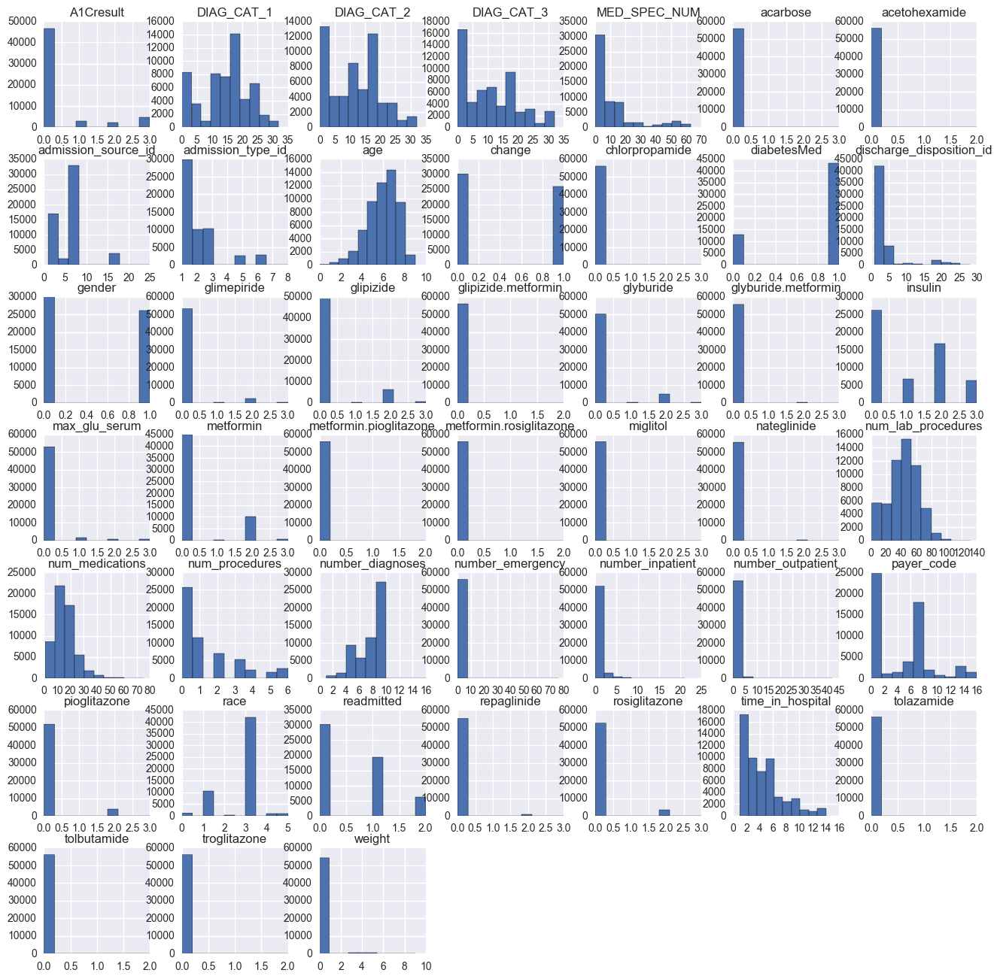

In [310]:
#histograms for all factors
df.hist(figsize=(16,16))

>## Since the goal is to find out what causes a 'readmitted' < 30 days,
## need to combine those not readmitted and those readmitted > 30 days.

In [311]:
#create 2nd 'readmitted' column
df['readm2'] = df['readmitted']
df.head(12)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide.metformin,glipizide.metformin,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted,readm2
0,3,0,8,0,3,1,4,5,0,0,39,3,11,0,0,0,10,4,18,7,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
1,3,0,7,0,5,3,1,6,7,0,79,1,25,3,0,0,16,13,16,9,0,0,2,0,0,0,0,0,0,2,0,0,0,0,0,0,0,3,0,0,0,0,1,1,0,0
2,5,0,6,0,1,22,7,4,14,18,29,2,18,0,0,1,24,18,2,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0,0
3,3,1,7,0,1,1,7,3,0,18,72,3,18,0,0,0,17,4,3,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,1,1
4,3,0,3,0,2,1,1,3,0,0,21,1,6,0,0,0,23,18,32,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,3,1,7,0,2,1,1,2,0,18,4,0,7,0,0,0,14,9,3,8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,3,0,4,0,1,1,7,6,14,33,89,0,25,0,2,1,25,10,16,9,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,1,1,0,0
7,3,0,7,0,1,6,7,4,6,0,63,0,22,0,2,4,16,3,3,5,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
8,3,1,6,0,1,1,7,6,7,0,45,0,24,0,0,0,16,9,3,7,0,3,2,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0,0,0,0,1,1,0,0
9,3,1,8,0,1,1,7,2,3,0,45,0,13,0,0,0,17,3,3,9,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0


>## NB: Using 12 rows because the 12th row (row 11) is the first instance of a patient being readmitted < 30 days

In [312]:
#replace the values of the 'readm2' column:
# NO = 0  ==> 0 -> NO
# >30 = 1 ==> 1 -> >30
# <30 = 2 ==> 2 -> <30

df = df.replace({'readm2': {0: 'NO', 1: '>30', 2: '<30'}})

df.head(12)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide.metformin,glipizide.metformin,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted,readm2
0,3,0,8,0,3,1,4,5,0,0,39,3,11,0,0,0,10,4,18,7,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,>30
1,3,0,7,0,5,3,1,6,7,0,79,1,25,3,0,0,16,13,16,9,0,0,2,0,0,0,0,0,0,2,0,0,0,0,0,0,0,3,0,0,0,0,1,1,0,NO
2,5,0,6,0,1,22,7,4,14,18,29,2,18,0,0,1,24,18,2,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0,NO
3,3,1,7,0,1,1,7,3,0,18,72,3,18,0,0,0,17,4,3,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,1,>30
4,3,0,3,0,2,1,1,3,0,0,21,1,6,0,0,0,23,18,32,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NO
5,3,1,7,0,2,1,1,2,0,18,4,0,7,0,0,0,14,9,3,8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NO
6,3,0,4,0,1,1,7,6,14,33,89,0,25,0,2,1,25,10,16,9,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,1,1,0,NO
7,3,0,7,0,1,6,7,4,6,0,63,0,22,0,2,4,16,3,3,5,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,>30
8,3,1,6,0,1,1,7,6,7,0,45,0,24,0,0,0,16,9,3,7,0,3,2,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0,0,0,0,1,1,0,NO
9,3,1,8,0,1,1,7,2,3,0,45,0,13,0,0,0,17,3,3,9,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,NO


In [313]:
#replace the values of the 'readm2' column:
# NO = 0  ==> 0 -> NO ==> NO -> 0
# >30 = 1 ==> 1 -> >30 ==> >30 -> 0
# <30 = 2 ==> 2 -> <30 ==> <30 -> 1

df = df.replace({'readm2': {'NO': 0, '>30': 0, '<30': 1}})

df.head(12)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide.metformin,glipizide.metformin,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readmitted,readm2
0,3,0,8,0,3,1,4,5,0,0,39,3,11,0,0,0,10,4,18,7,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0
1,3,0,7,0,5,3,1,6,7,0,79,1,25,3,0,0,16,13,16,9,0,0,2,0,0,0,0,0,0,2,0,0,0,0,0,0,0,3,0,0,0,0,1,1,0,0
2,5,0,6,0,1,22,7,4,14,18,29,2,18,0,0,1,24,18,2,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0,0
3,3,1,7,0,1,1,7,3,0,18,72,3,18,0,0,0,17,4,3,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,1,0
4,3,0,3,0,2,1,1,3,0,0,21,1,6,0,0,0,23,18,32,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,3,1,7,0,2,1,1,2,0,18,4,0,7,0,0,0,14,9,3,8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,3,0,4,0,1,1,7,6,14,33,89,0,25,0,2,1,25,10,16,9,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,1,1,0,0
7,3,0,7,0,1,6,7,4,6,0,63,0,22,0,2,4,16,3,3,5,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0
8,3,1,6,0,1,1,7,6,7,0,45,0,24,0,0,0,16,9,3,7,0,3,2,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0,0,0,0,1,1,0,0
9,3,1,8,0,1,1,7,2,3,0,45,0,13,0,0,0,17,3,3,9,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0


In [314]:
# drop readmitted - will use readm2 as Y instead
df = df.drop('readmitted', axis=1)
df.head(12)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide.metformin,glipizide.metformin,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readm2
0,3,0,8,0,3,1,4,5,0,0,39,3,11,0,0,0,10,4,18,7,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,3,0,7,0,5,3,1,6,7,0,79,1,25,3,0,0,16,13,16,9,0,0,2,0,0,0,0,0,0,2,0,0,0,0,0,0,0,3,0,0,0,0,1,1,0
2,5,0,6,0,1,22,7,4,14,18,29,2,18,0,0,1,24,18,2,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0
3,3,1,7,0,1,1,7,3,0,18,72,3,18,0,0,0,17,4,3,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0
4,3,0,3,0,2,1,1,3,0,0,21,1,6,0,0,0,23,18,32,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,3,1,7,0,2,1,1,2,0,18,4,0,7,0,0,0,14,9,3,8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,3,0,4,0,1,1,7,6,14,33,89,0,25,0,2,1,25,10,16,9,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,1,1,0
7,3,0,7,0,1,6,7,4,6,0,63,0,22,0,2,4,16,3,3,5,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
8,3,1,6,0,1,1,7,6,7,0,45,0,24,0,0,0,16,9,3,7,0,3,2,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0,0,0,0,1,1,0
9,3,1,8,0,1,1,7,2,3,0,45,0,13,0,0,0,17,3,3,9,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0


In [315]:
#basic statistics
df.describe()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide.metformin,glipizide.metformin,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readm2
count,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000
mean,2.602071,0.464464,6.096589,0.123946,2.016893,3.721821,5.756643,4.398161,4.369375,10.668643,43.141661,1.335893,16.009268,0.367321,0.196875,0.637054,14.213321,12.011054,11.357411,7.423750,0.092089,0.368375,0.398875,0.029911,0.014089,0.001732,0.102536,0.000036,0.254732,0.210071,0.000357,0.146161,0.125821,0.006214,0.000857,0.000107,0.000714,1.058839,0.013214,0.000321,0.000036,0.000036,0.462679,0.769821,0.112232
std,0.937754,0.498740,1.590761,0.712004,1.438340,5.291517,4.053838,2.984346,4.363828,15.595799,19.656507,1.702009,8.132455,1.249570,0.916820,1.270768,7.272908,7.443902,8.157131,1.931488,0.431655,0.890972,0.815169,0.247161,0.169132,0.060480,0.449274,0.008452,0.678992,0.627625,0.026724,0.525985,0.490002,0.112904,0.042249,0.014638,0.037790,1.102484,0.162472,0.025353,0.008452,0.008452,0.498610,0.420951,0.315655
min,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,0.000000,5.000000,0.000000,1.000000,1.000000,1.000000,2.000000,0.000000,0.000000,32.000000,0.000000,10.000000,0.000000,0.000000,0.000000,10.000000,4.000000,3.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,3.000000,0.000000,6.000000,0.000000,1.000000,1.000000,7.000000,4.000000,6.000000,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,15.000000,12.000000,10.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,3.000000,1.000000,7.000000,0.000000,3.000000,4.000000,7.000000,6.000000,7.000000,18.000000,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,18.000000,17.000000,17.000000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
max,5.000000,1.000000,9.000000,9.000000,8.000000,28.000000,25.000000,14.000000,16.000000,63.000000,132.000000,6.000000,75.000000,42.000000,76.000000,21.000000,32.000000,32.000000,32.000000,16.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,2.000000,3.000000,3.000000,2.000000,3.000000,3.000000,3.000000,3.0000

In [316]:
# describe for a single column
df['readm2'].describe()

count    56000.000000
mean         0.112232
std          0.315655
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: readm2, dtype: float64

In [317]:
# how many unique values in the 'readm2' column
df.groupby('readm2').size()

readm2
0    49715
1     6285
dtype: int64

In [318]:
# pivot talbe for 'readm2'
df.groupby(['readm2']).count()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide.metformin,glipizide.metformin,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed
readm2,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715,49715
1,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285,6285


In [319]:
# pivot table for 'pep' showing mean value, not count
df.groupby(['readm2']).mean()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide.metformin,glipizide.metformin,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed
readm2,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2.599195,0.465071,6.088062,0.124329,2.020859,3.624982,5.748587,4.354038,4.381334,10.748466,43.013356,1.343961,15.915820,0.35957,0.179362,0.563552,14.229367,11.999216,11.321774,7.392296,0.090395,0.372906,0.406779,0.029367,0.014020,0.001911,0.102826,0.00004,0.253927,0.211184,0.000402,0.147119,0.127406,0.006316,0.000885,0.000121,0.000805,1.049140,0.013557,0.000322,0.00004,0.00004,0.459358,0.766107
1,2.624821,0.459666,6.164041,0.120923,1.985521,4.487828,5.820366,4.747176,4.274781,10.037232,44.156563,1.272076,16.748449,0.42864,0.335402,1.218457,14.086396,12.104694,11.639300,7.672554,0.105489,0.332538,0.336356,0.034208,0.014638,0.000318,0.100239,0.00000,0.261098,0.201273,0.000000,0.138584,0.113286,0.005410,0.000636,0.000000,0.000000,1.135561,0.010501,0.000318,0.00000,0.00000,0.488942,0.799204


In [320]:
#regression correlation
df.corr()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide.metformin,glipizide.metformin,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed,readm2
race,1.000000,0.061706,0.114255,0.040520,0.096587,0.005805,0.033113,-0.020364,0.041640,-0.030777,-0.023193,0.024391,0.022157,0.050845,-0.012812,-0.006053,0.042924,0.029594,0.016000,0.081672,0.054576,-0.013318,0.010548,0.025466,-0.004170,0.006801,0.008261,0.001793,0.018551,0.015784,-0.001455,0.026105,0.005938,0.013237,-0.001307,0.003106,0.003990,-0.039862,0.006384,0.005380,-0.011726,0.001793,0.008300,-0.004537,0.008626
gender,0.061706,1.000000,-0.048579,0.014491,0.014578,-0.019566,-0.005222,-0.031088,0.000833,0.016623,-0.004968,0.061668,-0.023819,-0.005846,-0.024202,-0.013405,-0.034311,0.008083,0.008343,-0.007818,-0.001347,0.016539,0.001549,-0.004777,-0.005390,0.006481,-0.000156,-0.003935,0.026810,0.034631,-0.001727,0.002339,0.010843,0.010581,0.009920,0.007860,0.003242,0.000247,0.002489,0.007965,0.004538,-0.003935,0.012476,0.015391,-0.003421
age,0.114255,-0.048579,1.000000,0.005716,-0.005747,0.113970,0.041070,0.107273,0.058032,-0.068202,0.025665,-0.028360,0.039010,0.029064,-0.089149,-0.047012,0.091837,0.077541,0.052021,0.243515,0.018618,-0.147559,-0.060696,0.045565,0.020363,0.012367,0.044360,0.002400,0.055867,0.076798,0.010110,0.013860,0.003034,0.008092,0.011788,-0.001978,0.003605,-0.079078,-0.002451,0.003658,0.002400,-0.000257,-0.037793,-0.025360,0.015077
weight,0.040520,0.014491,0.005716,1.000000,0.037503,-0.035383,0.003026,0.023652,0.047819,0.004630,0.090456,0.018693,0.011274,0.104440,0.003706,-0.009154,0.023982,0.031824,0.014000,0.054391,-0.037139,-0.021109,0.007304,-0.005440,0.010707,-0.000839,0.013694,-0.000736,0.017062,0.008707,-0.002326,0.026059,0.004232,0.010411,-0.003532,-0.001274,0.000692,-0.076697,-0.014159,-0.002207,-0.000736,-0.000736,-0.041219,-0.030585,-0.001510
admission_type_id,0.096587,0.014578,-0.005747,0.037503,1.000000,0.085986,0.098007,-0.014285,-0.136863,0.185351,-0.145869,0.131923,0.075711,0.030746,-0.018190,-0.032648,0.032151,-0.005648,-0.008918,-0.113991,0.352793,-0.043929,0.008631,-0.003481,-0.008099,0.007875,-0.003178,-0.002988,0.007991,-0.002804,0.006347,0.018570,0.022930,0.006061,-0.001414,0.003307,0.010291,-0.025368,-0.000573,-0.005046,-0.002988,0.002888,0.003992,-0.003930,-0.007755
discharge_disposition_id,0.005805,-0.019566,0.113970,-0.035383,0.085986,1.000000,0.016614,0.161954,-0.123220,-0.024028,0.022906,0.015536,0.105415,-0.006101,-0.024692,0.019240,0.034616,0.029774,0.024778,0.049496,0.037086,-0.020713,-0.008376,-0.002759,-0.008790,0.018525,-0.022360,0.014597,-0.013379,0.048256,0.003228,-0.014116,-0.001694,0.006779,0.005779,0.008684,0.013139,-0.041842,-0.002994,0.000933,-0.002174,-0.000576,-0.014047,-0.029452,0.051471
admission_source_id,0.033113,-0.005222,0.041070,0.003026,0.098007,0.016614,1.000000,-0.006996,-0.100157,-0.152760,0.046823,-0.137044,-0.055016,0.028833,0.061938,0.033697,-0.007753,-0.019796,0.001447,0.076318,0.412356,0.006512,-0.033283,-0.003732,-0.019612,0.002666,-0.026685,0.001296,0.009300,0.004919,0.001791,-0.005729,-0.008894,-0.000753,-0.000763,0.002245,0.001834,0.005094,-0.024616,-0.000281,0.001296,-0.004958,0.002583,0.000535,0.005589
time_in_hospital,-0.020364,-0.031088,0.107273,0.023652,-0.014285,0.161954,-0.006996,1.000000,-0.037805,0.023146,0.318234,0.193139,0.468752,-0.003410,-0.005467,0.079929,-0.019913,0.086503,0.068677,0.224265,0.029079,0.058088,-0.009071,0.034985,0.003320,0.004094,0.016086,0.013596,0.016737,0.023482,0.001799,0.008521,0.008531,0.007231,0.005083,0.004746,0.00

>## Preliminary possibilites correlated with readm2 has changed versus readmitted
- number_emergency = 0.103321 ==> No longer is showing significant correlation now at 0.053
- number_inpatient = 0.233149 ==> Is now the only one showing any significant correlation at 0.162
- number_diagnoses = 0.103885 ==> No longer is showing significant correlation now at 0.045

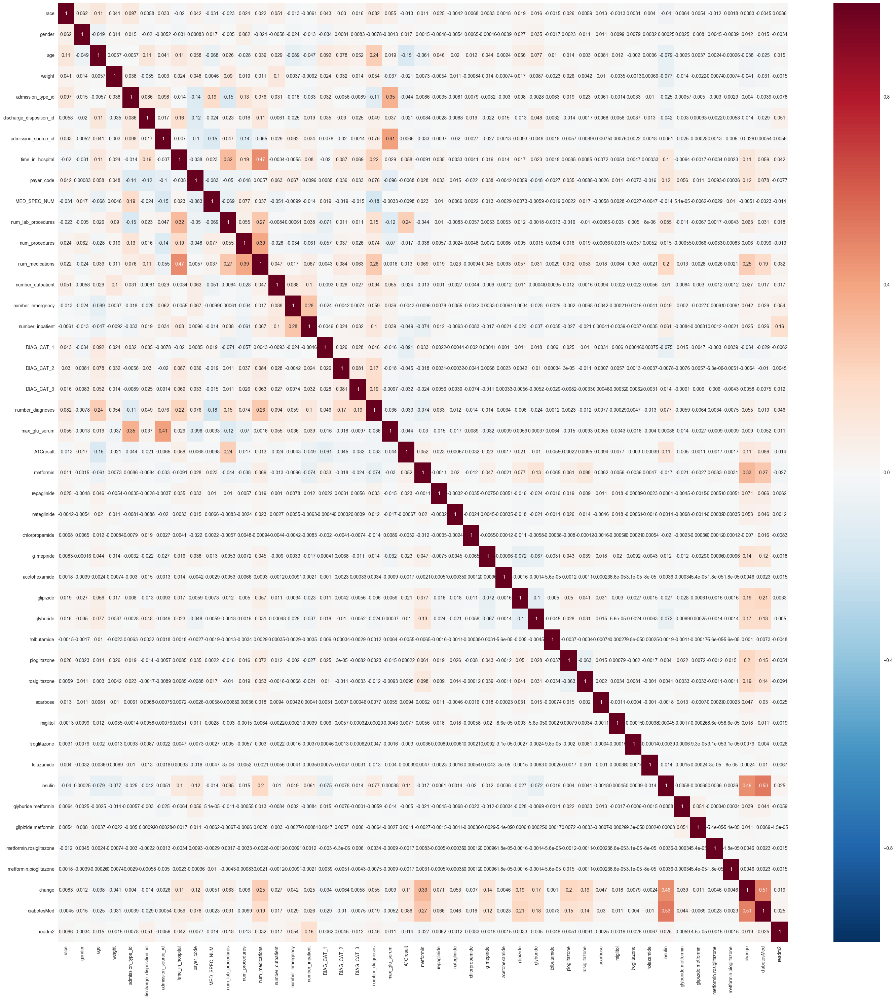

In [321]:
# heatmap for correlation
plt.figure(figsize=(35,36))
sns.heatmap(df.corr(), annot=True)

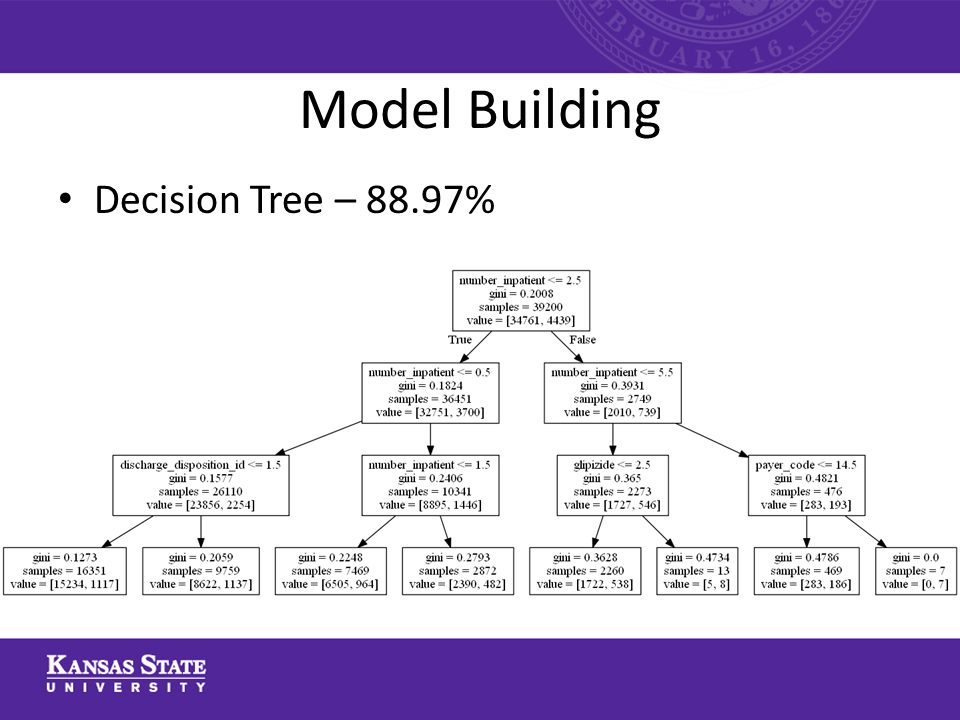

In [387]:
# input model building slide here
Image('Images/christensen_finalprj/Slide10.png')

>## Classification Model building.
- Need to narrow down the number of factors in order to focus on the most significant ones

>## ExtraTreeClassifier

In [323]:
# Set Y and X

y = df['readm2']
X = df.drop(['readm2'], axis=1)
X.head(12)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide.metformin,glipizide.metformin,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed
0,3,0,8,0,3,1,4,5,0,0,39,3,11,0,0,0,10,4,18,7,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,3,0,7,0,5,3,1,6,7,0,79,1,25,3,0,0,16,13,16,9,0,0,2,0,0,0,0,0,0,2,0,0,0,0,0,0,0,3,0,0,0,0,1,1
2,5,0,6,0,1,22,7,4,14,18,29,2,18,0,0,1,24,18,2,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1
3,3,1,7,0,1,1,7,3,0,18,72,3,18,0,0,0,17,4,3,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1
4,3,0,3,0,2,1,1,3,0,0,21,1,6,0,0,0,23,18,32,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,3,1,7,0,2,1,1,2,0,18,4,0,7,0,0,0,14,9,3,8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,3,0,4,0,1,1,7,6,14,33,89,0,25,0,2,1,25,10,16,9,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,1,1
7,3,0,7,0,1,6,7,4,6,0,63,0,22,0,2,4,16,3,3,5,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
8,3,1,6,0,1,1,7,6,7,0,45,0,24,0,0,0,16,9,3,7,0,3,2,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0,0,0,0,1,1
9,3,1,8,0,1,1,7,2,3,0,45,0,13,0,0,0,17,3,3,9,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1


In [324]:
# build logisticRegression

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

lr = LogisticRegression()
lr.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [325]:
# build ExtraTreesClassifier

model_extra = ExtraTreesClassifier()
model_extra.fit(X, y)
model_extra.score(X, y)

# display the relative importance of each attribute
print(model_extra.feature_importances_)

[  2.91794982e-02   2.53679647e-02   5.37078564e-02   7.50331122e-03
   3.35746117e-02   4.57729444e-02   2.97595433e-02   5.66506897e-02
   4.27513308e-02   4.18174543e-02   6.59548839e-02   4.37842852e-02
   6.46074445e-02   2.93875786e-02   2.45889522e-02   5.46483089e-02
   5.79017039e-02   5.91816193e-02   5.91892575e-02   4.36703730e-02
   7.38929730e-03   1.52840833e-02   1.17254508e-02   4.00583871e-03
   2.24838652e-03   8.73138518e-05   8.64359359e-03   1.86232908e-06
   1.34819531e-02   1.19863156e-02   2.40050594e-05   9.38387138e-03
   7.51014406e-03   1.08885851e-03   1.67479741e-04   4.64248888e-06
   3.14279024e-05   2.30591406e-02   1.41216087e-03   8.83976179e-05
   0.00000000e+00   3.74683575e-07   9.02443469e-03   4.35135523e-03]


In [326]:
# What are the highest ranking X variables according to ExtraTreeClassifier?

print("Features sorted by their rank:")
print(sorted(zip(map(lambda x: round(x, 4), model_extra.feature_importances_), X.columns)))

Features sorted by their rank:
[(0.0, 'acetohexamide'), (0.0, 'metformin.pioglitazone'), (0.0, 'metformin.rosiglitazone'), (0.0, 'tolazamide'), (0.0, 'tolbutamide'), (0.0, 'troglitazone'), (0.0001, 'chlorpropamide'), (0.0001, 'glipizide.metformin'), (0.00020000000000000001, 'miglitol'), (0.0011000000000000001, 'acarbose'), (0.0014, 'glyburide.metformin'), (0.0022000000000000001, 'nateglinide'), (0.0040000000000000001, 'repaglinide'), (0.0044000000000000003, 'diabetesMed'), (0.0074000000000000003, 'max_glu_serum'), (0.0074999999999999997, 'rosiglitazone'), (0.0074999999999999997, 'weight'), (0.0086, 'glimepiride'), (0.0089999999999999993, 'change'), (0.0094000000000000004, 'pioglitazone'), (0.0117, 'metformin'), (0.012, 'glyburide'), (0.0135, 'glipizide'), (0.015299999999999999, 'A1Cresult'), (0.023099999999999999, 'insulin'), (0.0246, 'number_emergency'), (0.025399999999999999, 'gender'), (0.0292, 'race'), (0.029399999999999999, 'number_outpatient'), (0.0298, 'admission_source_id'), (0

>## All facotrs with less than 0.005 (rounded) will be removed
- 'repaglinide' at 0.0041 and less are dropped
- 'diabetesMed' at 0.0049 and above are kept

In [327]:
#drop or remove the column 'ID' since this column is not used in the analysis and disply the result
df = df.drop('acetohexamide', axis=1)
df = df.drop('metformin.pioglitazone', axis=1)
df = df.drop('metformin.rosiglitazone', axis=1)
df = df.drop('tolazamide', axis=1)

df = df.drop('tolbutamide', axis=1)
df = df.drop('troglitazone', axis=1)
df = df.drop('chlorpropamide', axis=1)
df = df.drop('glipizide.metformin', axis=1)
df = df.drop('miglitol', axis=1)
df = df.drop('acarbose', axis=1)
df = df.drop('glyburide.metformin', axis=1)
df = df.drop('nateglinide', axis=1)
df = df.drop('repaglinide', axis=1)


df.head(12)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,change,diabetesMed,readm2
0,3,0,8,0,3,1,4,5,0,0,39,3,11,0,0,0,10,4,18,7,0,0,0,0,0,2,0,0,0,0,1,0
1,3,0,7,0,5,3,1,6,7,0,79,1,25,3,0,0,16,13,16,9,0,0,2,0,0,2,0,0,3,1,1,0
2,5,0,6,0,1,22,7,4,14,18,29,2,18,0,0,1,24,18,2,9,0,0,0,0,0,0,0,0,2,0,1,0
3,3,1,7,0,1,1,7,3,0,18,72,3,18,0,0,0,17,4,3,9,0,0,0,0,0,0,0,0,2,0,1,0
4,3,0,3,0,2,1,1,3,0,0,21,1,6,0,0,0,23,18,32,9,0,0,0,0,0,0,0,0,0,0,0,0
5,3,1,7,0,2,1,1,2,0,18,4,0,7,0,0,0,14,9,3,8,0,0,0,0,0,0,0,0,0,0,0,0
6,3,0,4,0,1,1,7,6,14,33,89,0,25,0,2,1,25,10,16,9,0,0,2,0,0,0,0,0,2,1,1,0
7,3,0,7,0,1,6,7,4,6,0,63,0,22,0,2,4,16,3,3,5,0,0,2,0,0,0,0,0,0,0,1,0
8,3,1,6,0,1,1,7,6,7,0,45,0,24,0,0,0,16,9,3,7,0,3,2,0,0,0,2,0,1,1,1,0
9,3,1,8,0,1,1,7,2,3,0,45,0,13,0,0,0,17,3,3,9,0,0,0,0,2,0,0,0,1,1,1,0


In [328]:
#general info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56000 entries, 0 to 55999
Data columns (total 32 columns):
race                        56000 non-null int64
gender                      56000 non-null int64
age                         56000 non-null int64
weight                      56000 non-null int64
admission_type_id           56000 non-null int64
discharge_disposition_id    56000 non-null int64
admission_source_id         56000 non-null int64
time_in_hospital            56000 non-null int64
payer_code                  56000 non-null int64
MED_SPEC_NUM                56000 non-null int64
num_lab_procedures          56000 non-null int64
num_procedures              56000 non-null int64
num_medications             56000 non-null int64
number_outpatient           56000 non-null int64
number_emergency            56000 non-null int64
number_inpatient            56000 non-null int64
DIAG_CAT_1                  56000 non-null int64
DIAG_CAT_2                  56000 non-null int64
DIAG_CAT_

In [329]:
#basic statistics
df.describe()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,change,diabetesMed,readm2
count,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000
mean,2.602071,0.464464,6.096589,0.123946,2.016893,3.721821,5.756643,4.398161,4.369375,10.668643,43.141661,1.335893,16.009268,0.367321,0.196875,0.637054,14.213321,12.011054,11.357411,7.423750,0.092089,0.368375,0.398875,0.102536,0.254732,0.210071,0.146161,0.125821,1.058839,0.462679,0.769821,0.112232
std,0.937754,0.498740,1.590761,0.712004,1.438340,5.291517,4.053838,2.984346,4.363828,15.595799,19.656507,1.702009,8.132455,1.249570,0.916820,1.270768,7.272908,7.443902,8.157131,1.931488,0.431655,0.890972,0.815169,0.449274,0.678992,0.627625,0.525985,0.490002,1.102484,0.498610,0.420951,0.315655
min,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,0.000000,5.000000,0.000000,1.000000,1.000000,1.000000,2.000000,0.000000,0.000000,32.000000,0.000000,10.000000,0.000000,0.000000,0.000000,10.000000,4.000000,3.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,3.000000,0.000000,6.000000,0.000000,1.000000,1.000000,7.000000,4.000000,6.000000,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,15.000000,12.000000,10.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000
75%,3.000000,1.000000,7.000000,0.000000,3.000000,4.000000,7.000000,6.000000,7.000000,18.000000,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,18.000000,17.000000,17.000000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000,1.000000,0.000000
max,5.000000,1.000000,9.000000,9.000000,8.000000,28.000000,25.000000,14.000000,16.000000,63.000000,132.000000,6.000000,75.000000,42.000000,76.000000,21.000000,32.000000,32.000000,32.000000,16.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,1.000000,1.000000,1.000000


In [330]:
#correlation analysis
df.corr()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,change,diabetesMed,readm2
race,1.000000,0.061706,0.114255,0.040520,0.096587,0.005805,0.033113,-0.020364,0.041640,-0.030777,-0.023193,0.024391,0.022157,0.050845,-0.012812,-0.006053,0.042924,0.029594,0.016000,0.081672,0.054576,-0.013318,0.010548,0.008261,0.018551,0.015784,0.026105,0.005938,-0.039862,0.008300,-0.004537,0.008626
gender,0.061706,1.000000,-0.048579,0.014491,0.014578,-0.019566,-0.005222,-0.031088,0.000833,0.016623,-0.004968,0.061668,-0.023819,-0.005846,-0.024202,-0.013405,-0.034311,0.008083,0.008343,-0.007818,-0.001347,0.016539,0.001549,-0.000156,0.026810,0.034631,0.002339,0.010843,0.000247,0.012476,0.015391,-0.003421
age,0.114255,-0.048579,1.000000,0.005716,-0.005747,0.113970,0.041070,0.107273,0.058032,-0.068202,0.025665,-0.028360,0.039010,0.029064,-0.089149,-0.047012,0.091837,0.077541,0.052021,0.243515,0.018618,-0.147559,-0.060696,0.044360,0.055867,0.076798,0.013860,0.003034,-0.079078,-0.037793,-0.025360,0.015077
weight,0.040520,0.014491,0.005716,1.000000,0.037503,-0.035383,0.003026,0.023652,0.047819,0.004630,0.090456,0.018693,0.011274,0.104440,0.003706,-0.009154,0.023982,0.031824,0.014000,0.054391,-0.037139,-0.021109,0.007304,0.013694,0.017062,0.008707,0.026059,0.004232,-0.076697,-0.041219,-0.030585,-0.001510
admission_type_id,0.096587,0.014578,-0.005747,0.037503,1.000000,0.085986,0.098007,-0.014285,-0.136863,0.185351,-0.145869,0.131923,0.075711,0.030746,-0.018190,-0.032648,0.032151,-0.005648,-0.008918,-0.113991,0.352793,-0.043929,0.008631,-0.003178,0.007991,-0.002804,0.018570,0.022930,-0.025368,0.003992,-0.003930,-0.007755
discharge_disposition_id,0.005805,-0.019566,0.113970,-0.035383,0.085986,1.000000,0.016614,0.161954,-0.123220,-0.024028,0.022906,0.015536,0.105415,-0.006101,-0.024692,0.019240,0.034616,0.029774,0.024778,0.049496,0.037086,-0.020713,-0.008376,-0.022360,-0.013379,0.048256,-0.014116,-0.001694,-0.041842,-0.014047,-0.029452,0.051471
admission_source_id,0.033113,-0.005222,0.041070,0.003026,0.098007,0.016614,1.000000,-0.006996,-0.100157,-0.152760,0.046823,-0.137044,-0.055016,0.028833,0.061938,0.033697,-0.007753,-0.019796,0.001447,0.076318,0.412356,0.006512,-0.033283,-0.026685,0.009300,0.004919,-0.005729,-0.008894,0.005094,0.002583,0.000535,0.005589
time_in_hospital,-0.020364,-0.031088,0.107273,0.023652,-0.014285,0.161954,-0.006996,1.000000,-0.037805,0.023146,0.318234,0.193139,0.468752,-0.003410,-0.005467,0.079929,-0.019913,0.086503,0.068677,0.224265,0.029079,0.058088,-0.009071,0.016086,0.016737,0.023482,0.008521,0.008531,0.101223,0.112359,0.059464,0.041582
payer_code,0.041640,0.000833,0.058032,0.047819,-0.136863,-0.123220,-0.100157,-0.037805,1.000000,-0.082746,-0.049680,-0.047581,0.005658,0.062572,0.067316,0.009598,0.008458,0.036335,0.033135,0.076424,-0.095739,-0.006824,0.027596,0.038055,0.005875,-0.047599,0.034867,-0.008782,0.115265,0.121010,0.077597,-0.007707
MED_SPEC_NUM,-0.030777,0.016623,-0.068202,0.004630,0.185351,-0.024028,-0.152760,0.023146,-0.082746,1.000000,-0.068863,0.076952,0.036943,-0.051445,-0.009879,-0.013909,0.018820,-0.019354,-0.015192,-0.176693,-0.003316,-0.009813,0.023068,0.012798,0.007273,-0.005929,0.002210,0.016639,-0.014342,-0.005111,-0.002299,-0.014395


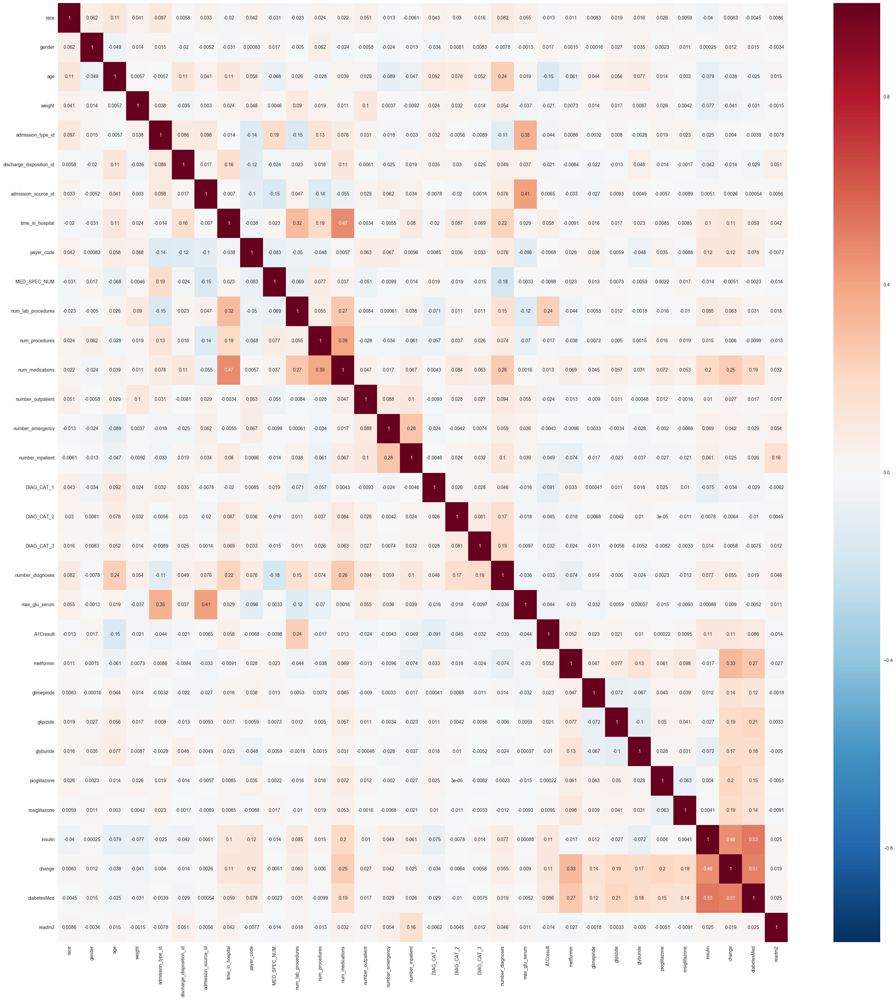

In [331]:
# heatmap for correlation
plt.figure(figsize=(35,36))
sns.heatmap(df.corr(), annot=True)

>## Decision Tree Model Building, Validation, Evaluation
- Remember the model should be "simple, but not too simple"

>## Going to Split Data into two Different Sets
- Training Set
- Test Set

In [332]:
# Set Y and X

y = df['readm2']
X = df.drop(['readm2'], axis=1)
X.head(12)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,change,diabetesMed
0,3,0,8,0,3,1,4,5,0,0,39,3,11,0,0,0,10,4,18,7,0,0,0,0,0,2,0,0,0,0,1
1,3,0,7,0,5,3,1,6,7,0,79,1,25,3,0,0,16,13,16,9,0,0,2,0,0,2,0,0,3,1,1
2,5,0,6,0,1,22,7,4,14,18,29,2,18,0,0,1,24,18,2,9,0,0,0,0,0,0,0,0,2,0,1
3,3,1,7,0,1,1,7,3,0,18,72,3,18,0,0,0,17,4,3,9,0,0,0,0,0,0,0,0,2,0,1
4,3,0,3,0,2,1,1,3,0,0,21,1,6,0,0,0,23,18,32,9,0,0,0,0,0,0,0,0,0,0,0
5,3,1,7,0,2,1,1,2,0,18,4,0,7,0,0,0,14,9,3,8,0,0,0,0,0,0,0,0,0,0,0
6,3,0,4,0,1,1,7,6,14,33,89,0,25,0,2,1,25,10,16,9,0,0,2,0,0,0,0,0,2,1,1
7,3,0,7,0,1,6,7,4,6,0,63,0,22,0,2,4,16,3,3,5,0,0,2,0,0,0,0,0,0,0,1
8,3,1,6,0,1,1,7,6,7,0,45,0,24,0,0,0,16,9,3,7,0,3,2,0,0,0,2,0,1,1,1
9,3,1,8,0,1,1,7,2,3,0,45,0,13,0,0,0,17,3,3,9,0,0,0,0,2,0,0,0,1,1,1


In [333]:
# evaluate the model by splitting into train (70%) and test sets (30%)
# http://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html

# name the model as "dt"

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=None, splitter='best')

In [334]:
#Model evaluation
# http://scikit-learn.org/stable/modules/model_evaluation.html

print(metrics.accuracy_score(y_test, dt.predict(X_test)))
print(metrics.confusion_matrix(y_test, dt.predict(X_test)))
print(metrics.classification_report(y_test, dt.predict(X_test)))
print(metrics.roc_auc_score(y_test, dt.predict(X_test)))

# y-test is the acual y value in the testing dataset
# dt.predict(X_test) is the y value generated by your model
# If they are same, we can say your model is accurate.

0.796428571429
[[13017  1937]
 [ 1483   363]]
             precision    recall  f1-score   support

          0       0.90      0.87      0.88     14954
          1       0.16      0.20      0.18      1846

avg / total       0.82      0.80      0.81     16800

0.533555413199


>## Question: Interpret the results of confusion matrix
- 13032 correctly classified as those who will not be readmitted.
- 1922 misclassified as those who will be readmitted, but actually will not be readmitted
- 299 correctly classified as those who will be readmitted
- 1547 misclassified as those who will not be readmitted, but actually will be readmitted
      - Model accuracy would therefore be calculated as:
         - (13012+383) / (13012+1942+1463+383) = 13395/16800 = 0.7973 ==> Expect to be 79.73% accurate when this model is applied to real-world situation.

>## Visualizing decision tree
- There are two methods for this. You can use either method. 
- Using Graphviz software. For this option, you need to have GraphViz installed in your mahcine.

In [335]:
# Graphviz
tree.export_graphviz(dt, out_file='data/decisiontree.dot', feature_names=X.columns)

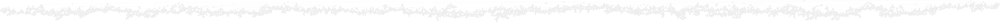

In [336]:
# This is a "full-grown" tree 
from IPython.display import Image
Image("data/decisiontree.png")

>## Interpreting decision tree
- Practical Sized Decision Tree

In [337]:
# Set Y and X

y = df['readm2']
X = df.drop(['readm2'], axis=1)

In [338]:
#max_depth = 5 ... otherwise you will get a full-grown tree, which is overfitting

# You can make a simpler decision tree

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
dt_simple = DecisionTreeClassifier(max_depth=3, min_samples_leaf=5)
dt_simple.fit(X_train, y_train)

# max_depth : The maximum depth of the tree. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples.

# min_samples_leaf : The minimum number of samples required to be at a leaf node

# http://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=3,
            max_features=None, max_leaf_nodes=None, min_samples_leaf=5,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=None, splitter='best')

In [339]:
# Find out the performance of this model & interpret the results

print(metrics.accuracy_score(y_test, dt_simple.predict(X_test)))
print(metrics.confusion_matrix(y_test, dt_simple.predict(X_test)))
print(metrics.classification_report(y_test, dt_simple.predict(X_test)))
print(metrics.roc_auc_score(y_test, dt_simple.predict(X_test)))

0.889761904762
[[14946     8]
 [ 1844     2]]
             precision    recall  f1-score   support

          0       0.89      1.00      0.94     14954
          1       0.20      0.00      0.00      1846

avg / total       0.81      0.89      0.84     16800

0.500274224849


In [340]:
# Visualize the simpler decision tree model (dt_simple)

tree.export_graphviz(dt_simple, out_file='data/decisiontree_simple.dot', feature_names=X.columns)

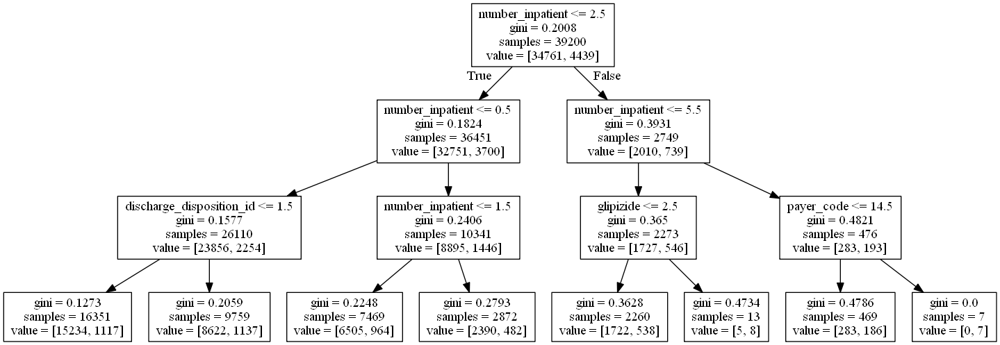

In [341]:
# Embed decision tree

from IPython.display import Image
Image("data/decisiontree_simple.png")

>## Model Deployment: Predict y values 
- load Challenge_1_Validation_Work.csv (scoring dataset).
- This dataset has no y value, represeting the future.
- Apply your decision model and find out who is likely to be readmitted.

In [342]:
#import scoring data

#no Y value in this dataset ... 
#we are trying to predict whether the people in this scoring dataset are likely to be readmitted <30 days or not

score = pd.read_csv('data/Challenge_1_Validation_Work.csv')
score.head(5)

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,DIAG_CAT_1,diag_2,DIAG_CAT_2,diag_3,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed
0,166684116,25357527,Caucasian,Male,[40-50),?,3,11,1,2,MC,Nephrology,19,48,4,11,0,0,0,518,16,431,14,427,12,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No
1,118577202,111860712,Caucasian,Female,[40-50),?,1,1,7,2,BC,?,0,31,1,28,0,0,0,996,27,250,3,530,17,5,None,None,Steady,No,No,No,No,No,No,Steady,No,No,Steady,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes
2,44006898,20621907,Caucasian,Male,[60-70),?,6,7,7,1,?,InternalMedicine,18,42,0,12,0,0,0,786,23,V42,32,250,3,3,>200,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes
3,55615428,110263914,Caucasian,Female,[70-80),?,1,1,7,5,?,?,0,52,2,25,1,1,0,820,24,427,12,428,13,9,None,None,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes
4,201098010,96526827,Caucasian,Female,[40-50),?,2,1,7,2,SP,Surgery-General,55,41,2,3,0,0,0,455,15,535,17,211,2,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No


In [343]:
#drop or remove the columns 'encounter_id', 'patient_nbr' since this column is not used in the analysis and disply the result
score = score.drop('encounter_id', axis=1)
score = score.drop('patient_nbr', axis=1)
score = score.drop('medical_specialty', axis=1)

# drop or remove the columns 'diag_1', 'diag_2' and 'diag_3' since these values of been put into catergories
# in columns 'DIAG_CAT_1', 'DIAG_CAT_2' and 'DIAG_CAT_3'
score = score.drop('diag_1', axis=1)
score = score.drop('diag_2', axis=1)
score = score.drop('diag_3', axis=1)

score.head(5)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed
0,Caucasian,Male,[40-50),?,3,11,1,2,MC,19,48,4,11,0,0,0,16,14,12,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No
1,Caucasian,Female,[40-50),?,1,1,7,2,BC,0,31,1,28,0,0,0,27,3,17,5,None,None,Steady,No,No,No,No,No,No,Steady,No,No,Steady,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes
2,Caucasian,Male,[60-70),?,6,7,7,1,?,18,42,0,12,0,0,0,23,32,3,3,>200,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes
3,Caucasian,Female,[70-80),?,1,1,7,5,?,0,52,2,25,1,1,0,24,12,13,9,None,None,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes
4,Caucasian,Female,[40-50),?,2,1,7,2,SP,55,41,2,3,0,0,0,15,17,2,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No


In [344]:
#replace the values of the 'race' column:
# ? = 0
# AfricanAmerican = 1
# Asian = 2
# Caucasion = 3
# Hispanic = 4
# Other = 5

score = score.replace({'race': {'?': 0, 'AfricanAmerican': 1, 'Asian': 2,'Caucasian': 3,'Hispanic': 4,'Other': 5}})

score.head(2)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed
0,3,Male,[40-50),?,3,11,1,2,MC,19,48,4,11,0,0,0,16,14,12,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No
1,3,Female,[40-50),?,1,1,7,2,BC,0,31,1,28,0,0,0,27,3,17,5,None,None,Steady,No,No,No,No,No,No,Steady,No,No,Steady,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes


In [345]:
#replace the values of the 'gender' column:
# Female = 0
# Male = 1

score = score.replace({'gender': {'Male': 1, 'Female': 0}})

score.head(2)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed
0,3,1,[40-50),?,3,11,1,2,MC,19,48,4,11,0,0,0,16,14,12,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No
1,3,0,[40-50),?,1,1,7,2,BC,0,31,1,28,0,0,0,27,3,17,5,None,None,Steady,No,No,No,No,No,No,Steady,No,No,Steady,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes


In [346]:
#replace the values of the 'age' column:
# [0-10) = 0
# [10-20) = 1
# [20-30) = 2
# [30-40) = 3
# [40-50) = 4
# [50-60) = 5
# [60-70) = 6
# [70-80) = 7
# [80-90) = 8
# [90-100) = 9

score = score.replace({'age': {'[0-10)': 0, '[10-20)': 1, '[20-30)': 2, '[30-40)': 3, '[40-50)': 4, '[50-60)': 5, '[60-70)': 6, '[70-80)': 7, '[80-90)': 8, '[90-100)': 9}})

score.head(2)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed
0,3,1,4,?,3,11,1,2,MC,19,48,4,11,0,0,0,16,14,12,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No
1,3,0,4,?,1,1,7,2,BC,0,31,1,28,0,0,0,27,3,17,5,None,None,Steady,No,No,No,No,No,No,Steady,No,No,Steady,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes


In [347]:
#replace the values of the 'weight' column:
# ? = 0
# [0-25) = 1
# [25-50) = 2
# [50-75) = 3
# [75-100) = 4
# [100-125) = 5
# [125-150) = 6
# [150-175) = 7
# [175-200) = 8
# > 200 = 9

score = score.replace({'weight': {'?': 0, '[0-25)': 1, '[25-50)': 2, '[50-75)': 3, '[75-100)': 4, '[100-125)': 5, '[125-150)': 6, '[150-175)': 7, '[175-200)': 8, '>200': 9}})

score.head(2)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed
0,3,1,4,0,3,11,1,2,MC,19,48,4,11,0,0,0,16,14,12,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No
1,3,0,4,0,1,1,7,2,BC,0,31,1,28,0,0,0,27,3,17,5,None,None,Steady,No,No,No,No,No,No,Steady,No,No,Steady,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes


In [348]:
#replace the values of the 'payer_code' column:

score = score.replace({'payer_code': {'?': 0, 'BC': 1, 'CH': 2, 'CM': 3, 'CP': 4, 'DM': 5, 'HM': 6, 'MC': 7, 'MD': 8, 'MP': 9, 'OG': 10, 'OT': 11, 'PO': 12, 'SI': 13, 'SP': 14, 'UN': 15, 'WC': 16, 'FR': 19}})

score.head(2)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed
0,3,1,4,0,3,11,1,2,7,19,48,4,11,0,0,0,16,14,12,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No
1,3,0,4,0,1,1,7,2,1,0,31,1,28,0,0,0,27,3,17,5,None,None,Steady,No,No,No,No,No,No,Steady,No,No,Steady,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes


In [349]:
#distribution of payer_code categories in the payer_code column
score.groupby('payer_code').count()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed
payer_code,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513,5513
1,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668,668
2,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20
3,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274,274
4,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315
5,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69,69
6,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906,906
7,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437,4437
8,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484,484


In [350]:
score.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14000 entries, 0 to 13999
Data columns (total 47 columns):
race                        14000 non-null int64
gender                      14000 non-null int64
age                         14000 non-null int64
weight                      14000 non-null int64
admission_type_id           14000 non-null int64
discharge_disposition_id    14000 non-null int64
admission_source_id         14000 non-null int64
time_in_hospital            14000 non-null int64
payer_code                  14000 non-null int64
MED_SPEC_NUM                14000 non-null int64
num_lab_procedures          14000 non-null int64
num_procedures              14000 non-null int64
num_medications             14000 non-null int64
number_outpatient           14000 non-null int64
number_emergency            14000 non-null int64
number_inpatient            14000 non-null int64
DIAG_CAT_1                  14000 non-null int64
DIAG_CAT_2                  14000 non-null int64
DIAG_CAT_

In [351]:
#replace the values of the 'max_glu_serum' column:
# None = 0
# Norm = 1
# >200 = 2
# >300 = 3

score = score.replace({'max_glu_serum': {'None': 0, 'Norm': 1, '>200': 2, '>300': 3}})

score.head(2)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed
0,3,1,4,0,3,11,1,2,7,19,48,4,11,0,0,0,16,14,12,9,0,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No
1,3,0,4,0,1,1,7,2,1,0,31,1,28,0,0,0,27,3,17,5,0,None,Steady,No,No,No,No,No,No,Steady,No,No,Steady,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes


In [352]:
#replace the values of the 'A1Cresult' column:
# None = 0
# Norm = 1
# >7 = 2
# >8 = 3

score = score.replace({'A1Cresult': {'None': 0, 'Norm': 1, '>7': 2, '>8': 3}})

score.head(2)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed
0,3,1,4,0,3,11,1,2,7,19,48,4,11,0,0,0,16,14,12,9,0,0,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No
1,3,0,4,0,1,1,7,2,1,0,31,1,28,0,0,0,27,3,17,5,0,0,Steady,No,No,No,No,No,No,Steady,No,No,Steady,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes


In [353]:
#replace the values of the 'change' column:
# No = 0
# Ch = 1

score = score.replace({'change': {'No': 0, 'Ch': 1}})

score.head(2)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed
0,3,1,4,0,3,11,1,2,7,19,48,4,11,0,0,0,16,14,12,9,0,0,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,0,No
1,3,0,4,0,1,1,7,2,1,0,31,1,28,0,0,0,27,3,17,5,0,0,Steady,No,No,No,No,No,No,Steady,No,No,Steady,No,No,No,No,No,No,Up,No,No,No,No,No,1,Yes


In [354]:
#replace the values of the 'diabetesMed' column:
# No = 0
# Yes = 1

score = score.replace({'diabetesMed': {'No': 0, 'Yes': 1,}})

score.head(2)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed
0,3,1,4,0,3,11,1,2,7,19,48,4,11,0,0,0,16,14,12,9,0,0,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,0,0
1,3,0,4,0,1,1,7,2,1,0,31,1,28,0,0,0,27,3,17,5,0,0,Steady,No,No,No,No,No,No,Steady,No,No,Steady,No,No,No,No,No,No,Up,No,No,No,No,No,1,1


In [355]:
#replace the values in the medicene column:
# No = 0
# Down = 1
# Steady = 2
# Up = 3

score = score.replace({'metformin': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'repaglinide': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'nateglinide': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'chlorpropamide': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'glimepiride': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'acetohexamide': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'glipizide': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'glyburide': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'tolbutamide': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'pioglitazone': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'rosiglitazone': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'acarbose': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'miglitol': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'troglitazone': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'tolazamide': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'examide': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'citoglipton': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'insulin': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'glyburide.metformin': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'glipizide.metformin': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'glimepiride.pioglitazone': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'metformin.rosiglitazone': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})
score = score.replace({'metformin.pioglitazone': {'No': 0, 'Down': 1, 'Steady': 2, 'Up': 3}})

score.head(2)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide.metformin,glipizide.metformin,glimepiride.pioglitazone,metformin.rosiglitazone,metformin.pioglitazone,change,diabetesMed
0,3,1,4,0,3,11,1,2,7,19,48,4,11,0,0,0,16,14,12,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,3,0,4,0,1,1,7,2,1,0,31,1,28,0,0,0,27,3,17,5,0,0,2,0,0,0,0,0,0,2,0,0,2,0,0,0,0,0,0,3,0,0,0,0,0,1,1


In [356]:
# save converted data frame with only int to a new file
score_clean_NoString = score

In [357]:
#info
score_clean_NoString.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14000 entries, 0 to 13999
Data columns (total 47 columns):
race                        14000 non-null int64
gender                      14000 non-null int64
age                         14000 non-null int64
weight                      14000 non-null int64
admission_type_id           14000 non-null int64
discharge_disposition_id    14000 non-null int64
admission_source_id         14000 non-null int64
time_in_hospital            14000 non-null int64
payer_code                  14000 non-null int64
MED_SPEC_NUM                14000 non-null int64
num_lab_procedures          14000 non-null int64
num_procedures              14000 non-null int64
num_medications             14000 non-null int64
number_outpatient           14000 non-null int64
number_emergency            14000 non-null int64
number_inpatient            14000 non-null int64
DIAG_CAT_1                  14000 non-null int64
DIAG_CAT_2                  14000 non-null int64
DIAG_CAT_

In [358]:
# write dataframe with no string values to new csv file
score_clean_NoString.to_csv('data/Challenge_1_Validation_Work_Clean_NoString.csv')

In [359]:
#score = pd.read_csv('data/Challenge_1_Validation_Work.csv')

>## Random Forest

In [360]:
score.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14000 entries, 0 to 13999
Data columns (total 47 columns):
race                        14000 non-null int64
gender                      14000 non-null int64
age                         14000 non-null int64
weight                      14000 non-null int64
admission_type_id           14000 non-null int64
discharge_disposition_id    14000 non-null int64
admission_source_id         14000 non-null int64
time_in_hospital            14000 non-null int64
payer_code                  14000 non-null int64
MED_SPEC_NUM                14000 non-null int64
num_lab_procedures          14000 non-null int64
num_procedures              14000 non-null int64
num_medications             14000 non-null int64
number_outpatient           14000 non-null int64
number_emergency            14000 non-null int64
number_inpatient            14000 non-null int64
DIAG_CAT_1                  14000 non-null int64
DIAG_CAT_2                  14000 non-null int64
DIAG_CAT_

In [361]:
# Set Y and X

y = df['readm2']
X = df.drop(['readm2'], axis=1)

In [362]:
X.head(12)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,change,diabetesMed
0,3,0,8,0,3,1,4,5,0,0,39,3,11,0,0,0,10,4,18,7,0,0,0,0,0,2,0,0,0,0,1
1,3,0,7,0,5,3,1,6,7,0,79,1,25,3,0,0,16,13,16,9,0,0,2,0,0,2,0,0,3,1,1
2,5,0,6,0,1,22,7,4,14,18,29,2,18,0,0,1,24,18,2,9,0,0,0,0,0,0,0,0,2,0,1
3,3,1,7,0,1,1,7,3,0,18,72,3,18,0,0,0,17,4,3,9,0,0,0,0,0,0,0,0,2,0,1
4,3,0,3,0,2,1,1,3,0,0,21,1,6,0,0,0,23,18,32,9,0,0,0,0,0,0,0,0,0,0,0
5,3,1,7,0,2,1,1,2,0,18,4,0,7,0,0,0,14,9,3,8,0,0,0,0,0,0,0,0,0,0,0
6,3,0,4,0,1,1,7,6,14,33,89,0,25,0,2,1,25,10,16,9,0,0,2,0,0,0,0,0,2,1,1
7,3,0,7,0,1,6,7,4,6,0,63,0,22,0,2,4,16,3,3,5,0,0,2,0,0,0,0,0,0,0,1
8,3,1,6,0,1,1,7,6,7,0,45,0,24,0,0,0,16,9,3,7,0,3,2,0,0,0,2,0,1,1,1
9,3,1,8,0,1,1,7,2,3,0,45,0,13,0,0,0,17,3,3,9,0,0,0,0,2,0,0,0,1,1,1


In [363]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56000 entries, 0 to 55999
Data columns (total 32 columns):
race                        56000 non-null int64
gender                      56000 non-null int64
age                         56000 non-null int64
weight                      56000 non-null int64
admission_type_id           56000 non-null int64
discharge_disposition_id    56000 non-null int64
admission_source_id         56000 non-null int64
time_in_hospital            56000 non-null int64
payer_code                  56000 non-null int64
MED_SPEC_NUM                56000 non-null int64
num_lab_procedures          56000 non-null int64
num_procedures              56000 non-null int64
num_medications             56000 non-null int64
number_outpatient           56000 non-null int64
number_emergency            56000 non-null int64
number_inpatient            56000 non-null int64
DIAG_CAT_1                  56000 non-null int64
DIAG_CAT_2                  56000 non-null int64
DIAG_CAT_

In [364]:
score.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14000 entries, 0 to 13999
Data columns (total 47 columns):
race                        14000 non-null int64
gender                      14000 non-null int64
age                         14000 non-null int64
weight                      14000 non-null int64
admission_type_id           14000 non-null int64
discharge_disposition_id    14000 non-null int64
admission_source_id         14000 non-null int64
time_in_hospital            14000 non-null int64
payer_code                  14000 non-null int64
MED_SPEC_NUM                14000 non-null int64
num_lab_procedures          14000 non-null int64
num_procedures              14000 non-null int64
num_medications             14000 non-null int64
number_outpatient           14000 non-null int64
number_emergency            14000 non-null int64
number_inpatient            14000 non-null int64
DIAG_CAT_1                  14000 non-null int64
DIAG_CAT_2                  14000 non-null int64
DIAG_CAT_

In [365]:
#drop or remove these columns since they are not used in any of the cases
score = score.drop('examide', axis=1)
score = score.drop('citoglipton', axis=1)
score = score.drop('glimepiride.pioglitazone', axis=1)

#drop or remove the column 'ID' since this column is not used in the analysis and disply the result
score = score.drop('acetohexamide', axis=1)
score = score.drop('metformin.pioglitazone', axis=1)
score = score.drop('metformin.rosiglitazone', axis=1)
score = score.drop('tolazamide', axis=1)

score = score.drop('tolbutamide', axis=1)
score = score.drop('troglitazone', axis=1)
score = score.drop('chlorpropamide', axis=1)
score = score.drop('glipizide.metformin', axis=1)
score = score.drop('miglitol', axis=1)
score = score.drop('acarbose', axis=1)
score = score.drop('glyburide.metformin', axis=1)
score = score.drop('nateglinide', axis=1)
score = score.drop('repaglinide', axis=1)

score.head(12)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,change,diabetesMed
0,3,1,4,0,3,11,1,2,7,19,48,4,11,0,0,0,16,14,12,9,0,0,0,0,0,0,0,0,0,0,0
1,3,0,4,0,1,1,7,2,1,0,31,1,28,0,0,0,27,3,17,5,0,0,2,0,0,2,0,2,3,1,1
2,3,1,6,0,6,7,7,1,0,18,42,0,12,0,0,0,23,32,3,3,2,0,0,0,0,2,0,0,0,0,1
3,3,0,7,0,1,1,7,5,0,0,52,2,25,1,1,0,24,12,13,9,0,0,0,0,0,0,0,0,2,1,1
4,3,0,4,0,2,1,7,2,14,55,41,2,3,0,0,0,15,17,2,9,0,0,0,0,0,0,0,0,0,0,0
5,3,1,4,0,5,1,1,5,6,0,1,2,25,1,0,0,32,9,18,5,0,0,2,0,0,2,0,2,2,1,1
6,1,0,8,0,1,3,7,1,7,0,58,1,11,1,0,1,23,13,23,7,0,0,0,0,0,0,0,0,2,0,1
7,3,1,5,0,1,6,7,5,7,0,54,0,13,0,0,0,6,17,26,8,0,0,0,0,0,0,0,0,2,0,1
8,3,0,8,0,2,3,1,3,0,0,48,0,10,0,0,0,17,3,18,7,0,1,0,0,0,2,0,0,2,1,1
9,3,0,8,0,1,3,7,4,1,0,41,0,14,0,0,1,24,18,3,9,0,0,0,0,1,0,0,0,0,1,1


In [366]:
score.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14000 entries, 0 to 13999
Data columns (total 31 columns):
race                        14000 non-null int64
gender                      14000 non-null int64
age                         14000 non-null int64
weight                      14000 non-null int64
admission_type_id           14000 non-null int64
discharge_disposition_id    14000 non-null int64
admission_source_id         14000 non-null int64
time_in_hospital            14000 non-null int64
payer_code                  14000 non-null int64
MED_SPEC_NUM                14000 non-null int64
num_lab_procedures          14000 non-null int64
num_procedures              14000 non-null int64
num_medications             14000 non-null int64
number_outpatient           14000 non-null int64
number_emergency            14000 non-null int64
number_inpatient            14000 non-null int64
DIAG_CAT_1                  14000 non-null int64
DIAG_CAT_2                  14000 non-null int64
DIAG_CAT_

In [367]:
# develop a random forest model
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(n_estimators=20)    #building 20 decision trees
clf=clf.fit(X, y)
clf.score(X,y)

0.99219642857142853

>## Random Forest = 99.23%

In [368]:
# generate evaluation metrics
print(metrics.accuracy_score(y, clf.predict(X))) #overall accuracy
print(metrics.confusion_matrix(y, clf.predict(X)))
print(metrics.classification_report(y, clf.predict(X)))

0.992196428571
[[49715     0]
 [  437  5848]]
             precision    recall  f1-score   support

          0       0.99      1.00      1.00     49715
          1       1.00      0.93      0.96      6285

avg / total       0.99      0.99      0.99     56000



In [369]:
print("Features sorted by their rank:")
print(sorted(zip(map(lambda x: round(x, 4), clf.feature_importances_), X.columns)))

Features sorted by their rank:
[(0.0058999999999999999, 'weight'), (0.0071000000000000004, 'max_glu_serum'), (0.0077000000000000002, 'rosiglitazone'), (0.0080999999999999996, 'glimepiride'), (0.0091999999999999998, 'diabetesMed'), (0.0094999999999999998, 'pioglitazone'), (0.0109, 'glyburide'), (0.011900000000000001, 'metformin'), (0.0134, 'glipizide'), (0.0143, 'change'), (0.017000000000000001, 'A1Cresult'), (0.017000000000000001, 'number_emergency'), (0.019, 'gender'), (0.021700000000000001, 'number_outpatient'), (0.023400000000000001, 'race'), (0.023599999999999999, 'admission_source_id'), (0.027099999999999999, 'admission_type_id'), (0.028400000000000002, 'insulin'), (0.035000000000000003, 'number_diagnoses'), (0.0361, 'num_procedures'), (0.037600000000000001, 'discharge_disposition_id'), (0.038600000000000002, 'payer_code'), (0.044400000000000002, 'number_inpatient'), (0.044699999999999997, 'MED_SPEC_NUM'), (0.048599999999999997, 'age'), (0.0591, 'time_in_hospital'), (0.06519999999

In [370]:
# another method
pd.DataFrame({'feature':X.columns, 'importance':clf.feature_importances_})

,feature,importance
0,race,0.023426
1,gender,0.018953
2,age,0.048555
3,weight,0.005906
4,admission_type_id,0.027056
5,discharge_disposition_id,0.037582
6,admission_source_id,0.023568
7,time_in_hospital,0.059076
8,payer_code,0.038612
9,MED_SPEC_NUM,0.044668


In [371]:
#Predict class probabilities for X
clf.predict_proba(X)

array([[ 0.95,  0.05],
       [ 1.  ,  0.  ],
       [ 0.95,  0.05],
       ..., 
       [ 0.95,  0.05],
       [ 0.95,  0.05],
       [ 0.8 ,  0.2 ]])

>## Make predictions on the new dataset (scoring dataset without y value)

In [372]:
score.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14000 entries, 0 to 13999
Data columns (total 31 columns):
race                        14000 non-null int64
gender                      14000 non-null int64
age                         14000 non-null int64
weight                      14000 non-null int64
admission_type_id           14000 non-null int64
discharge_disposition_id    14000 non-null int64
admission_source_id         14000 non-null int64
time_in_hospital            14000 non-null int64
payer_code                  14000 non-null int64
MED_SPEC_NUM                14000 non-null int64
num_lab_procedures          14000 non-null int64
num_procedures              14000 non-null int64
num_medications             14000 non-null int64
number_outpatient           14000 non-null int64
number_emergency            14000 non-null int64
number_inpatient            14000 non-null int64
DIAG_CAT_1                  14000 non-null int64
DIAG_CAT_2                  14000 non-null int64
DIAG_CAT_

In [373]:
score.head()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,change,diabetesMed
0,3,1,4,0,3,11,1,2,7,19,48,4,11,0,0,0,16,14,12,9,0,0,0,0,0,0,0,0,0,0,0
1,3,0,4,0,1,1,7,2,1,0,31,1,28,0,0,0,27,3,17,5,0,0,2,0,0,2,0,2,3,1,1
2,3,1,6,0,6,7,7,1,0,18,42,0,12,0,0,0,23,32,3,3,2,0,0,0,0,2,0,0,0,0,1
3,3,0,7,0,1,1,7,5,0,0,52,2,25,1,1,0,24,12,13,9,0,0,0,0,0,0,0,0,2,1,1
4,3,0,4,0,2,1,7,2,14,55,41,2,3,0,0,0,15,17,2,9,0,0,0,0,0,0,0,0,0,0,0


In [374]:
#score=pd.read_csv("data/Challenge_1_Validation_Work_Clean_NoString.csv")
output_scoring = clf.predict(score)
predicted_y= pd.DataFrame(output_scoring, columns=['Predicted_Readmit_30'])

probs = clf.predict_proba(score)
probs = pd.DataFrame(probs, columns=['Prob of NO', 'Prob of YES'])

readmit_patients = predicted_y.join(probs)

readmit_patients.to_csv("data/output_readmit_RandomForest_ScoringDataset.csv")

readmit_patients.head()

,Predicted_Readmit_30,Prob of NO,Prob of YES
0,0,1.00,0.00
1,0,0.95,0.05
2,0,1.00,0.00
3,0,0.95,0.05
4,0,0.70,0.30


In [375]:
#finally ...
data1 = score.join(readmit_patients) 
data1.head(10)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,MED_SPEC_NUM,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,DIAG_CAT_1,DIAG_CAT_2,DIAG_CAT_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,change,diabetesMed,Predicted_Readmit_30,Prob of NO,Prob of YES
0,3,1,4,0,3,11,1,2,7,19,48,4,11,0,0,0,16,14,12,9,0,0,0,0,0,0,0,0,0,0,0,0,1.00,0.00
1,3,0,4,0,1,1,7,2,1,0,31,1,28,0,0,0,27,3,17,5,0,0,2,0,0,2,0,2,3,1,1,0,0.95,0.05
2,3,1,6,0,6,7,7,1,0,18,42,0,12,0,0,0,23,32,3,3,2,0,0,0,0,2,0,0,0,0,1,0,1.00,0.00
3,3,0,7,0,1,1,7,5,0,0,52,2,25,1,1,0,24,12,13,9,0,0,0,0,0,0,0,0,2,1,1,0,0.95,0.05
4,3,0,4,0,2,1,7,2,14,55,41,2,3,0,0,0,15,17,2,9,0,0,0,0,0,0,0,0,0,0,0,0,0.70,0.30
5,3,1,4,0,5,1,1,5,6,0,1,2,25,1,0,0,32,9,18,5,0,0,2,0,0,2,0,2,2,1,1,0,0.85,0.15
6,1,0,8,0,1,3,7,1,7,0,58,1,11,1,0,1,23,13,23,7,0,0,0,0,0,0,0,0,2,0,1,0,0.95,0.05
7,3,1,5,0,1,6,7,5,7,0,54,0,13,0,0,0,6,17,26,8,0,0,0,0,0,0,0,0,2,0,1,0,0.95,0.05
8,3,0,8,0,2,3,1,3,0,0,48,0,10,0,0,0,17,3,18,7,0,1,0,0,0,2,0,0,2,1,1,0,0.85,0.15
9,3,0,8,0,1,3,7,4,1,0,41,0,14,0,0,1,24,18,3,9,0,0,0,0,1,0,0,0,0,1,1,0,0.95,0.05
